In [1]:
import numpy as np
import matplotlib.pyplot as plt
import h5py as h5
import sys
from tqdm import tqdm 
sys.path.append('/home/cosweeney/code/Fits/')

from colossus.cosmology import cosmology
cosmo = cosmology.setCosmology('planck13')
a = 0.83760
redshift=1/a-1
H = cosmo.Hz(redshift)
h = cosmo.h
print(cosmo.h, cosmo.Hz(redshift), cosmo.H0*cosmo.Ez(redshift))

sys.path.append('/home/cosweeney/code/Fits/')

sys.path.append('/home/cosweeney/code/Fits/Jocond')

from JoCond.jocond.losvd import *
from JoCond.jocond.cat import *
from JoCond.jocond.hgcf import *
from JoCond.jocond.myconfig import*

import matplotlib
matplotlib.rcParams.update({'text.usetex': True, 
                            'font.family': 'Computer Modern Roman'})

from scipy.stats import gennorm, norm, t
import warnings
warnings.filterwarnings('ignore')

from scipy.optimize import curve_fit

import pandas as pd


0.6777 74.71913613009617 74.71913613009617


In [2]:
Rvirs, Mvirs, mbins = compute_bin_virial_R_M('/spiff/cosweeney/Tables/halo_pair_cat_final2_HD.hdf5')

# radial bins, just out to 30/69 for now
r_edges = np.linspace(5, 30, (30-5)+1)
r_cens = (r_edges[1:]+r_edges[:-1])/2.0 

rlos_edges = np.linspace(0, 60, (60-0)+1)
rlos_cens = (rlos_edges[1:]+rlos_edges[:-1])/2.0 

massbin edges, in h^-1 sol mass: [8.00020227e+13 1.22732852e+14 1.88287152e+14 2.88855436e+14
 4.43139440e+14 6.79829904e+14 1.60000000e+15]


In [3]:
# bin sim data in bins of R
#vel_path = '/spiff/cosweeney/simulations/MDPL2/data/r_R_rlos_vpeclos_vphyslos_data_mass_100_cyl_6K_indmass.hdf5'
vel_path = '/spiff/cosweeney/simulations/MDPL2/data/r_R_rlos_vpeclos_vphyslos_data_mass_100_no_vlos_cut_lowmass.hdf5'

vpeclos  = []
vphyslos = []
rlos_R = []
R_R = []
M_R = []

with h5.File(vel_path, 'r') as hdf:
    for k in range(len(Mvirs)):
        rel_R = hdf[f'R/{k}'][()]
        rel_rlos = hdf[f'rlos/{k}'][()]
        vpec = hdf[f'vpeclos/{k}'][()]
        vphys = hdf[f'vphyslos/{k}'][()]
        Mvir = hdf[f'Mvir/{k}'][()]
        
        # Use digitize to bin all at once
        bin_indices = np.digitize(rel_R, r_edges) - 1
        
        for i in range(len(r_cens)):
            mask = bin_indices == i
            vpeclos.append(vpec[mask])
            vphyslos.append(vphys[mask])
            rlos_R.append(rel_rlos[mask])
            R_R.append(rel_R[mask])
            M_R.append(Mvir[mask])

In [4]:
# and now bins of R, rlos
vel_path = '/spiff/cosweeney/simulations/MDPL2/data/r_R_rlos_vpeclos_vphyslos_data_mass_100_no_vlos_cut_lowmass.hdf5'

vpeclos1 = []
vphyslos1 = []
R1 = []
rlos1 = []

with h5.File(vel_path, 'r') as hdf:
    for k in range(len(Mvirs)):
        rel_R = hdf[f'R/{str(k)}'][()]
        rel_rlos = hdf[f'rlos/{str(k)}'][()]
        vpec = hdf[f'vpeclos/{str(k)}'][()]
        vphys = hdf[f'vphyslos/{str(k)}'][()]
        
        for i, R in enumerate(r_cens):
            Rmask = (rel_R >= r_edges[i]) & (rel_R <= r_edges[i+1])
            rel_R_masked = rel_R[Rmask]
            rel_rlos_masked = rel_rlos[Rmask]
            vpec_masked = vpec[Rmask]
            vphys_masked = vphys[Rmask]

            
            for j, rlos in enumerate(rlos_cens):
                rmask = (rel_rlos_masked >= rlos_edges[j]) & (rel_rlos_masked <= rlos_edges[j+1])
                
                vpeclos1.append(vpec_masked[rmask])
                rlos1.append(rel_rlos_masked[rmask])
                R1.append(rel_R_masked[rmask])
                vphyslos1.append(vphys_masked[rmask])

In [5]:
# compute LS vr(r) profiles
r_edges_LS = np.linspace(0, 80, 80+1)
r_cens_LS = 0.5*(r_edges_LS[1:] + r_edges_LS[:-1])

vr_r = []

with h5.File(vel_path, 'r') as hdf:
    for k in range(len(Mvirs)):       
            rel_R = hdf[f'r/{str(k)}'][()]
            vr = hdf[f'vr/{str(k)}'][()]
            
            for i, R in enumerate(r_cens_LS):
                Rmask = (rel_R >= r_edges_LS[i]) & (rel_R <= r_edges_LS[i+1])
                vr_masked = vr[Rmask]

                vr_r.append(vr_masked)
        

In [ ]:
def skewed_t_pdf(x, xi, omega, alpha, nu):
    """
    Azzalini & Capitanio skewed t-distribution PDF
    
    Parameters:
    xi: location parameter
    omega: scale parameter (> 0)
    alpha: skewness parameter
    nu: degrees of freedom (> 0)
    """
    # Standardize
    z = (x - xi) / omega
    
    # Student's t PDF
    t_pdf = t.pdf(z, df=nu)
    
    # Student's t CDF with modified argument
    t_cdf = t.cdf(alpha * z * np.sqrt((nu + 1) / (nu + z**2)), df=nu + 1)
    
    # Skewed t PDF
    pdf = (2 / omega) * t_pdf * t_cdf
    
    return pdf

# plot <vr|r>
mean_vr_r = np.zeros((len(Mvirs), len(r_cens_LS)))
peak_vr_r = np.zeros((len(Mvirs), len(r_cens_LS)))
peak_err_r = np.zeros((len(Mvirs), len(r_cens_LS)))


std_vr_r = np.zeros((len(Mvirs), len(r_cens_LS)))
std_vt_r = np.zeros((len(Mvirs), len(r_cens_LS)))
std_vlos_r = np.zeros((len(Mvirs), len(r_cens_LS)))

for k in range(len(Mvirs)):
    for i in range(len(r_cens_LS)):
        index = i + k*(len(r_cens_LS))

        hist, edges = np.histogram(vr_r[index], bins='auto', range=[-4000, 4000], density=True)
        cent = 0.5*(edges[1:] + edges[:-1])

        # p, c = curve_fit(skewed_t_pdf, cent, hist, p0=[cent[np.argmax(hist)], 300, -0.1, 4], maxfev=2_000)


        # xs = np.linspace(cent[0], cent[-1], 1000)
        # peak = xs[np.argmax(skewed_t_pdf(xs, p[0], p[1], p[2], p[3]))] #cent[np.argmax(hist)]

        mean = np.mean(vr_r[index])

        try:
            p, c = curve_fit(skewed_t_pdf, cent, hist, p0=[cent[np.argmax(hist)], 300, -0.1, 4], maxfev=2_000)

            xs = np.linspace(cent[0], cent[-1], 10_000)
            peak = xs[np.argmax(skewed_t_pdf(xs, p[0], p[1], p[2], p[3]))] #cent[np.argmax(hist)]

        except RuntimeError:
            peak = np.nan

        if np.isnan(mean):
            print(k, i, mean, vr_r[index])
            break

        mean_vr_r[k, i] = mean
        peak_vr_r[k, i] = peak
        std_vr_r[k, i] = np.std(vr_r[index])


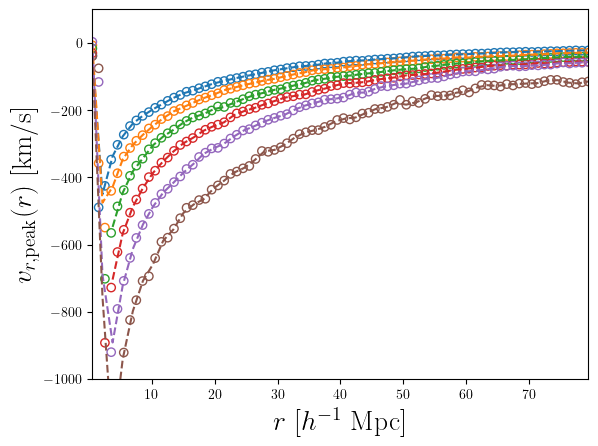

In [7]:
from scipy.interpolate import interp1d 

# vr_pars = np.zeros((len(Mvirs), 2))
# vr_errs = np.zeros((len(Mvirs), 2))

interps = []
m_interps = []

for k in range(len(Mvirs)):
    #plt.scatter(rlos_cens, peak_vr_r[k], color=f'C{k}')


    plt.scatter(r_cens_LS, peak_vr_r[k], edgecolors=f'C{k}', marker='o', facecolors='none')

    interp = interp1d(r_cens_LS, peak_vr_r[k], kind='slinear', bounds_error=False, fill_value='extrapolate')
    m_interp = interp1d(r_cens_LS, mean_vr_r[k], kind='slinear', bounds_error=False, fill_value='extrapolate')

    interps.append(interp)
    m_interps.append(m_interp)

    mask = (r_cens_LS > 5) & (~np.isnan(peak_vr_r[k]))

    #p, c = curve_fit(plawc, r_cens_LS[mask]/20, peak_vr_r[k][mask], maxfev=2_000)
    #vr_pars[k] = p
    #vr_errs[k] = np.sqrt(np.diag(c))

    rloss = np.linspace(r_cens_LS.min(), r_cens_LS.max())

    #plt.plot(rloss, plawc(rloss/20, p[0], p[1], p[2]))
    plt.plot(rloss, interp(rloss), color=f'C{k}', ls='--')


    plt.ylim((-1000, 100))
    #plt.ylim((-100, 1000))
    plt.margins(x=0)
    plt.ylabel(r"$v_{r, \rm peak}(r)$ [km/s]", fontsize=20)
    plt.xlabel(r"$r \ [h^{-1}$ Mpc]", fontsize=20)

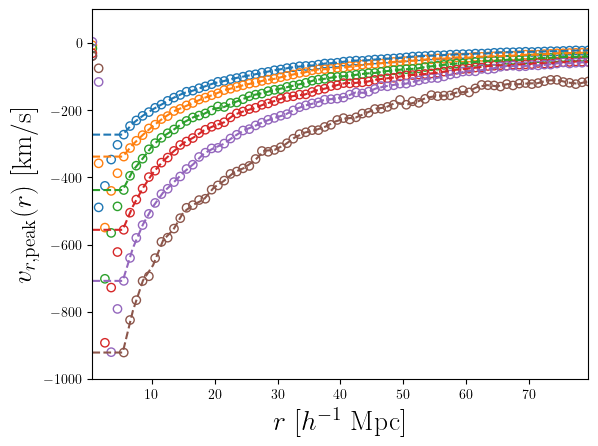

In [8]:
from scipy.interpolate import RectBivariateSpline

peak_vr_grid = np.array([peak_vr_r[k] for k in range(len(Mvirs))])

mask = ~np.isnan(peak_vr_grid)
RBinterp = RectBivariateSpline(np.log10(Mvirs), r_cens_LS[5:], peak_vr_grid[:, 5:], kx=3, ky=3) 

for k in range(len(Mvirs)):

    plt.scatter(r_cens_LS, peak_vr_r[k], edgecolors=f'C{k}', marker='o', facecolors='none')

    #mask = ~np.isnan(peak_vr_grid)

    #interp1d(r_cens_LS, peak_vr_r[k], kind='slinear', bounds_error=False, fill_value='extrapolate')

    #RBinterps.append(interp)

    mask = (r_cens_LS > 5) & (~np.isnan(peak_vr_r[k]))

    r_fine = np.linspace(r_cens_LS.min(), r_cens_LS.max())

    peak_vr_M = RBinterp(np.log10(Mvirs[k]), r_fine).squeeze()

    plt.plot(r_fine, peak_vr_M, color=f'C{k}', ls='--')

    plt.ylim((-1000, 100))
    #plt.ylim((-100, 1000)) 
    plt.margins(x=0)
    plt.ylabel(r"$v_{r, \rm peak}(r)$ [km/s]", fontsize=20)
    plt.xlabel(r"$r \ [h^{-1}$ Mpc]", fontsize=20)

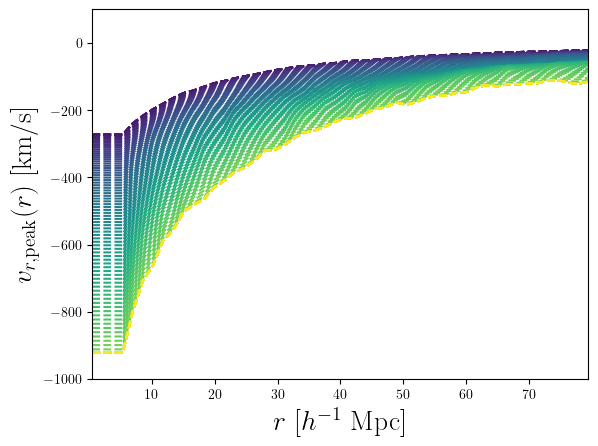

In [9]:
#plt.scatter(r_cens_LS, peak_vr_r[k], edgecolors=f'C{k}', marker='o', facecolors='none')

M_test = np.logspace(np.log10(mbins[0]), np.log10(mbins[-1]), 100)

cmap = plt.get_cmap('viridis').resampled(len(M_test))
colors = [cmap(i) for i in range(len(M_test))]

for k in range(len(M_test)):
    r_fine = np.linspace(r_cens_LS.min(), r_cens_LS.max())

    peak_vr_M = RBinterp(np.log10(M_test[k]), r_fine).squeeze()

    plt.plot(r_fine, peak_vr_M, color=colors[k], ls='--')

    plt.ylim((-1000, 100))
    plt.margins(x=0)
    plt.ylabel(r"$v_{r, \rm peak}(r)$ [km/s]", fontsize=20)
    plt.xlabel(r"$r \ [h^{-1}$ Mpc]", fontsize=20)


In [58]:
RBinterp(np.log10(Mvirs[k]), r_fine[0]).squeeze()

array(-921.2389989)

In [97]:
# fit skew-t to P(v_pec|R, rlos) with fixed nu for grid of nu

nus = [4, 5, 6, 7, 8, 9, 10]

STpars = np.zeros((len(nus), len(Mvirs), len(r_cens), len(rlos_cens), 3))
STerrs = np.zeros(STpars.shape)

for nu_i, nu in enumerate(nus):
    for k in range(len(Mvirs)):
        for j in range(len(r_cens)):
            for i in range(len(rlos_cens)):
                index = i + j*len(rlos_cens) + (k)*len(r_cens)*len(rlos_cens)

                r = np.sqrt(r_cens[j]**2 + rlos_cens[i]**2)
                theta = np.arctan2(rlos_cens[i], r_cens[j])
                sin = np.sin(theta)

                peak = interps[k](r)*sin #+ a*H*rlos_cens[i]/h

                ve = np.linspace(peak-2500, peak+2500, 50+1)
                vc = 0.5*(ve[1:] + ve[:-1])

                hist, edges = np.histogram(vpeclos1[index], bins=ve, density=True)
                cent = 0.5*(edges[1:] + edges[:-1])

                if np.isnan(hist).any():
                    break
                else:

                    p, c = curve_fit(lambda x, xi, omega, alpha: skewed_t_pdf(x, xi, omega, alpha, nu=nu), cent, hist, p0=[peak, 400, -0.1], maxfev=5_000)
                    
                    STpars[nu_i, k, j, i] = p
                    STerrs[nu_i, k, j, i] = np.sqrt(np.diag(c))

In [98]:
# save data
save_path = '/spiff/cosweeney/simulations/MDPL2/data/'

np.save(save_path+'R_rlos_30_40_STpars', STpars)

np.save(save_path+'R_rlos_30_40_STerrs', STerrs)

In [10]:
# load data 
save_path = '/spiff/cosweeney/simulations/MDPL2/data/'

nus = [4, 5, 6, 7, 8, 9, 10]

STpars = np.load(save_path+'R_rlos_30_40_STpars.npy')

STerrs = np.load(save_path+'R_rlos_30_40_STerrs.npy')

In [10]:
STpeaks = np.load(save_path+'R_rlos_30_40_STpeaks.npy')
STpeaks.shape

(7, 6, 25, 40)

In [11]:
from scipy.optimize import fsolve

def solve_ST_peak(stpars, init_guess):
    xi, omega, alpha, nu = stpars

    def tau(x):
        return np.sqrt((nu+1)/(nu+x**2))

    def f(z):
        return z - ( (alpha * nu)/(nu + 1) ) * tau(z) * t.pdf(alpha*z*tau(z), df=nu+1) / t.cdf(alpha*z*tau(z), df=nu+1)
    
    soln = fsolve(f, x0=(init_guess-xi)/omega, full_output=True, xtol=1e-18 )

    return xi + omega * soln[0]

In [12]:
# compute stpeaks

STpeaks = np.zeros((len(nus), len(Mvirs), len(r_cens), len(rlos_cens)))

#STpeaks = np.load(save_path+'R_rlos_30_40_STpeaks.npy')

for nu_i in range(len(nus)):
    for k in range(len(Mvirs)):
        for j in range(len(r_cens)):
            for i in range(len(rlos_cens)): 
                index = i + j*len(rlos_cens) + (k)*len(r_cens)*len(rlos_cens)

                r = np.sqrt(r_cens[j]**2 + rlos_cens[i]**2)
                theta = np.arctan2(rlos_cens[i], r_cens[j])
                sin = np.sin(theta)

                peak = RBinterp(np.log10(Mvirs[k]), r).squeeze() #interps[k](r)*sin #+ a*H*rlos_cens[i]/h

                stpeak = solve_ST_peak(np.append(STpars[nu_i, k, j, i], nus[nu_i]), peak)

                STpeaks[nu_i, k, j, i] = stpeak 


In [13]:
# save data
save_path = '/spiff/cosweeney/simulations/MDPL2/data/'

np.save(save_path+'R_rlos_30_60_STpeaks', STpeaks)

In [12]:
# load data 
save_path = '/spiff/cosweeney/simulations/MDPL2/data/'

STpeaks = np.load(save_path+'R_rlos_30_60_STpeaks.npy')

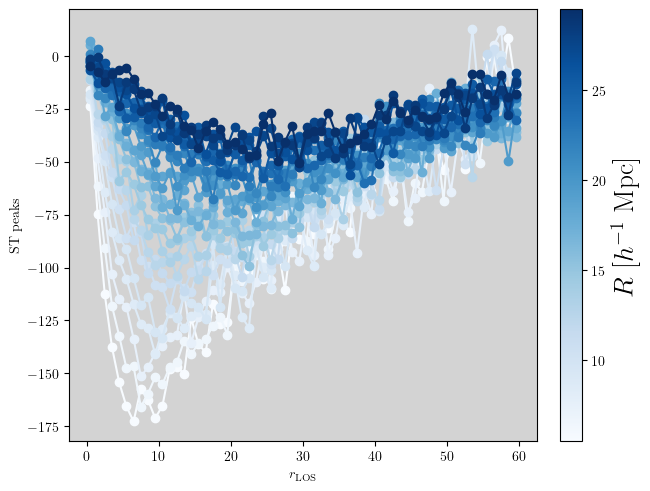

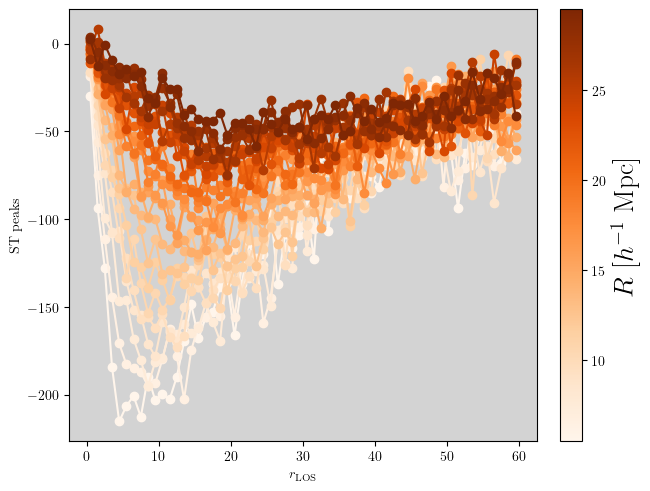

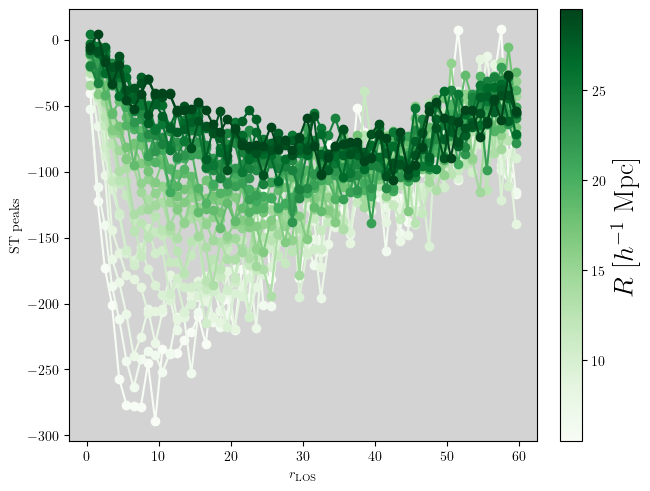

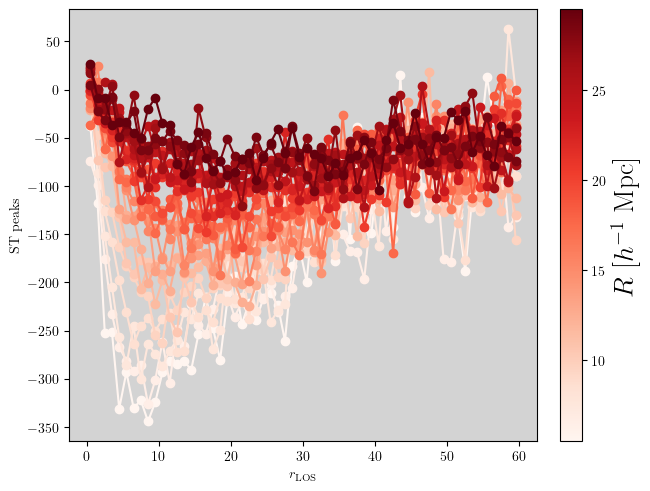

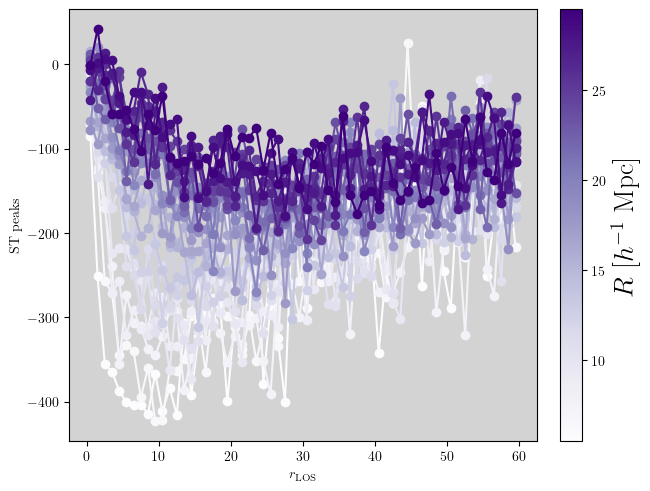

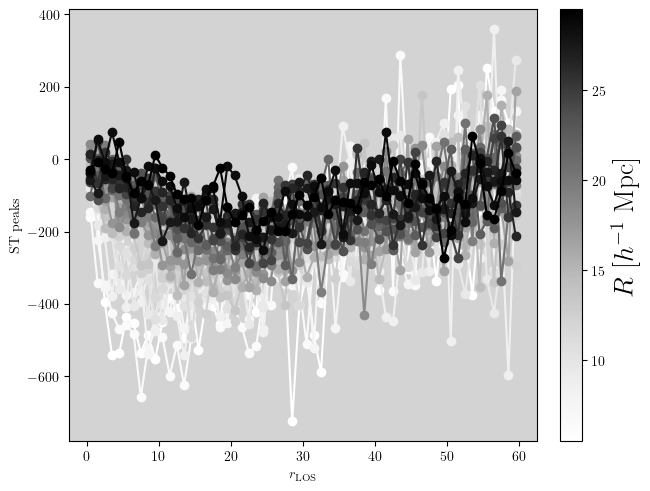

In [ ]:
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

colormap_list = [plt.cm.Blues, plt.cm.Oranges, plt.cm.Greens, 
                 plt.cm.Reds, plt.cm.Purples, plt.cm.Greys]

cmaps = [cmap(np.linspace(0, 1, len(r_cens))) for cmap in colormap_list]

for k in range(len(Mvirs)):
    fig, ax = plt.subplots(layout='constrained')    
    for j in range(len(r_cens), 5):

        ax.plot(rlos_cens, STpeaks[0, k, j], marker='o', c=cmaps[k][j])

    Norm = Normalize(vmin=min(r_cens), vmax=max(r_cens))
    sm = ScalarMappable(norm=Norm, cmap=colormap_list[k])
    sm.set_array([])  # dummy array
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label(r"$R \ [h^{-1}$ Mpc]", fontsize=20)
    ax.set_facecolor('lightgray')


    ax.set_xlabel(r"$r_{\rm LOS}$")
    ax.set_ylabel(r"ST peaks")

In [ ]:
print(nu_i, k, j, i) #after ~83 min. start from here when I get a chance. 

4 2 0 4


In [12]:
print(nu_i, k, j, i) #after ~83 + 34 min. start from here when I get a chance. 

6 3 6 32


In [20]:
save_path = '/spiff/cosweeney/simulations/MDPL2/data/'

np.save(save_path+'R_rlos_30_60_STpeaks', STpeaks)

In [12]:
#load
save_path = '/spiff/cosweeney/simulations/MDPL2/data/'

STpeaks = np.load(save_path+'R_rlos_30_60_STpeaks.npy')

In [ ]:
def xi_from_peak(mode, omega, alpha, nu):
    """
    Given a known mode and shape parameters, return xi such that
    the skew-t distribution with (xi, omega, alpha, nu) has its peak
    at `mode`.
    """
    # Solve for z* using xi=0 as placeholder — xi cancels out of f(z)
    z_star = solve_ST_peak(stpars=(0.0, omega, alpha, nu), init_guess=1)  # returns xi + omega*z*, with xi=0
    # z_star here is actually omega*z* (since xi=0, the return is 0 + omega*z_star)
    
    # So: xi = mode - omega*z_star (where omega*z_star is what solve_ST_peak returned)
    return mode - z_star

k, j, i = 0, 10, 0

xi_test = (mode=STpeaks[0, k, j, i], omega=STpars[0, k, j, i, 1], alpha=STpars[0, k, j, i, 2], nu=nus[0])

print(xi_test, STpars[0, k, j, i, 0]) # should be close!

[6.02492424] 6.024924243010305


In [ ]:
from scipy.optimize import fsolve

def solve_ST_peak(stpars, init_guess):
    xi, omega, alpha, nu = stpars

    def tau(x):
        return np.sqrt((nu+1)/(nu+x**2))

    def f(z):
        return z - ( (alpha * nu)/(nu + 1) ) * tau(z) * t.pdf(alpha*z*tau(z), df=nu+1) / t.cdf(alpha*z*tau(z), df=nu+1)
    
    soln = fsolve(f, x0=(init_guess-xi)/omega, full_output=True, xtol=1e-18 )

    return xi + omega * soln[0]

In [9]:
# calulate peaks directly

ST_peaks = np.zeros((len(nus), len(Mvirs), len(r_cens), len(rlos_cens)))

for nu_i, nu in enumerate(nus):
    for k in range(len(Mvirs)):
        for j in range(len(r_cens)):
            for i in range(len(rlos_cens)):
                xs = np.linspace(-3000, 3000, 10_000)

                xi, omega, alpha = STpars[nu_i, k, j, i]

                pdf = skewed_t_pdf(xs, xi, omega, alpha, nu=nu)

                ST_peaks[nu_i, k, j, i] = xs[np.argmax(pdf)]

In [41]:
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

colormap_list = [plt.cm.Blues, plt.cm.Oranges, plt.cm.Greens, 
                 plt.cm.Reds, plt.cm.Purples, plt.cm.Greys]

cmaps = [cmap(np.linspace(0, 1, len(r_cens))) for cmap in colormap_list]

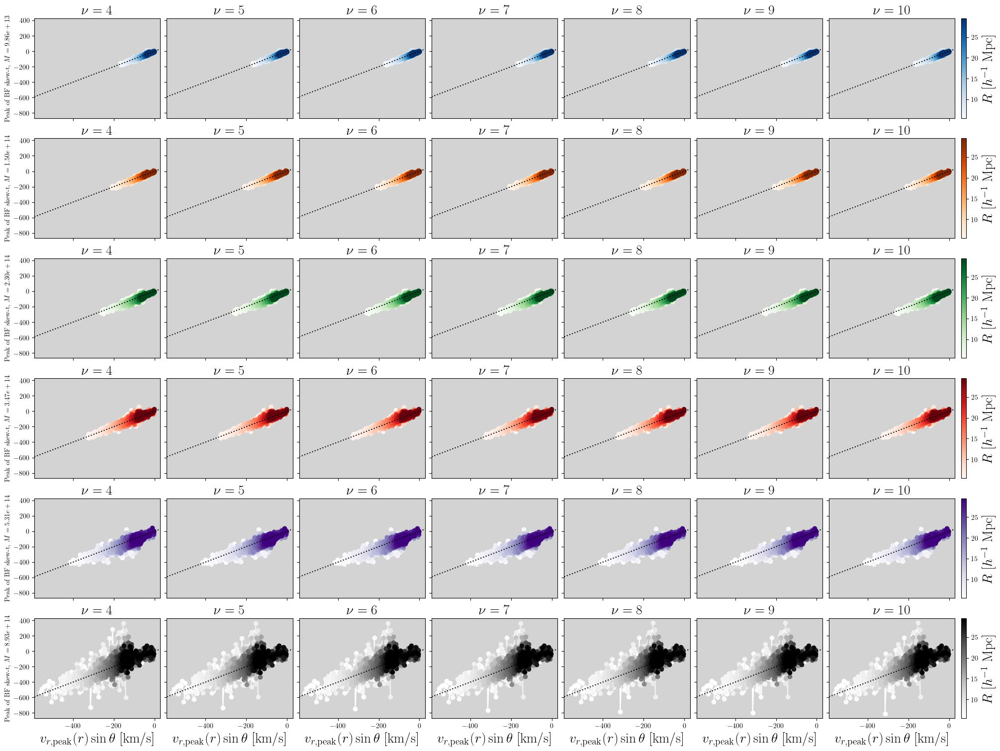

In [100]:
# how does BF peak relate to predicted peak?
fig, ax = plt.subplots(len(Mvirs), len(nus), figsize=(20, 15), layout='constrained', sharex=True, sharey=True)

for nu_i, nu in enumerate(nus):
    for k in range(0, len(Mvirs)):
        for j in range(len(r_cens)):
            r = np.sqrt(r_cens[j]**2 + rlos_cens**2)
            theta = np.arctan2(rlos_cens, r_cens[j])
            sin = np.sin(theta)

            peaks = interps[k](r)*sin

            ax[k, nu_i].plot(peaks, STpeaks[nu_i, k, j, :], c=cmaps[k][j], marker='o')
            ax[-1, nu_i].set_xlabel(r"$v_{r, \rm peak}(r)\sin\theta$ [km/s]", fontsize=20)
            ax[k, 0].set_ylabel(rf"Peak of BF skew-t, $M={Mvirs[k]:.2e}$", fontsize=10)
            ax[k, nu_i].set_title(rf"$\nu={nu}$", fontsize=20)

        ax[k, nu_i].axline((0, 0), slope=1, ls=':', c='k')
        ax[k, nu_i].set_facecolor('lightgray')
        
        if nu == nus[-1]:    
            Norm = Normalize(vmin=min(r_cens), vmax=max(r_cens))
            sm = ScalarMappable(norm=Norm, cmap=colormap_list[k])
            sm.set_array([])  # dummy array
            cbar = fig.colorbar(sm, ax=ax[k, -1])
            cbar.set_label(r"$R \ [h^{-1}$ Mpc]", fontsize=20)

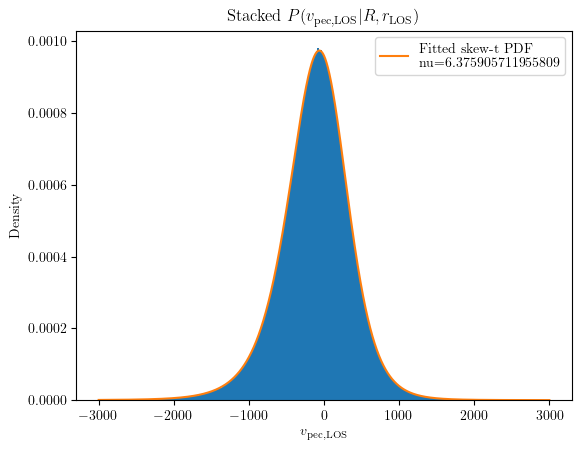

In [19]:
# fit for dof parameter by stacking all P(v_pec|R, rlos) together and fitting for nu

hist, bins, _ = plt.hist(np.concatenate(vpeclos1), bins='auto', density=True, range=[-3000, 3000])
cens = 0.5*(bins[1:] + bins[:-1])

p, c = curve_fit(skewed_t_pdf, cens, hist, p0=[cens[np.argmax(hist)], 300, -0.1, 4], maxfev=2_000)

plt.plot(cens, skewed_t_pdf(cens, p[0], p[1], p[2], p[3]), color='C1', ls='-', label=f'Fitted skew-t PDF\nnu={p[3]}')
plt.xlabel(r"$v_{\rm pec, LOS}$")
plt.ylabel(r"Density")
plt.title(r"Stacked $P(v_{\rm pec, LOS}|R, r_{\rm LOS})$")
plt.legend()


In [16]:
p

array([ 99.90771578, 436.08545376,  -0.65480198,   6.39988707])

In [13]:
len(nus)

7

In [14]:
nus[3]

7

In [15]:
STpars.shape

(7, 6, 25, 60, 3)

In [21]:
RBinterp(np.log10(Mvirs[k]), r).squeeze()

array(-122.69474284)

In [26]:
gammas

array([[[-0.1344633 , -0.22367109, -0.41420959, ..., -0.39203224,
         -0.58233939, -0.42877039],
        [-0.10743968, -0.18303908, -0.31180387, ..., -0.37594361,
         -0.44295724, -0.48779932],
        [-0.0539611 , -0.03957278, -0.31741821, ..., -0.71304004,
         -0.44345897, -0.39903799],
        ...,
        [ 0.01277634, -0.024561  , -0.05494642, ..., -0.38009947,
         -0.36604661, -0.4654873 ],
        [-0.07929536, -0.12655857, -0.0648432 , ..., -0.33944271,
         -0.30251017, -0.42278255],
        [ 0.03513718,  0.01646915, -0.07217557, ..., -0.40689853,
         -0.35864075, -0.33932114]],

       [[-0.17552732, -0.25339748, -0.51172816, ..., -0.08602676,
         -0.18212087, -0.17666929],
        [-0.19826775, -0.16192621, -0.45077261, ..., -0.25696266,
         -0.40377654, -0.30866553],
        [-0.07598519, -0.15003324, -0.16005667, ..., -0.36252187,
         -0.21143853, -0.19979573],
        ...,
        [ 0.07412338, -0.1011457 , -0.02916881, ..., -

In [32]:
(RBinterp(np.log10(Mvirs[k]), r).squeeze()*sin).shape

(60,)

In [49]:
vpksin[0].shape

(25, 60)

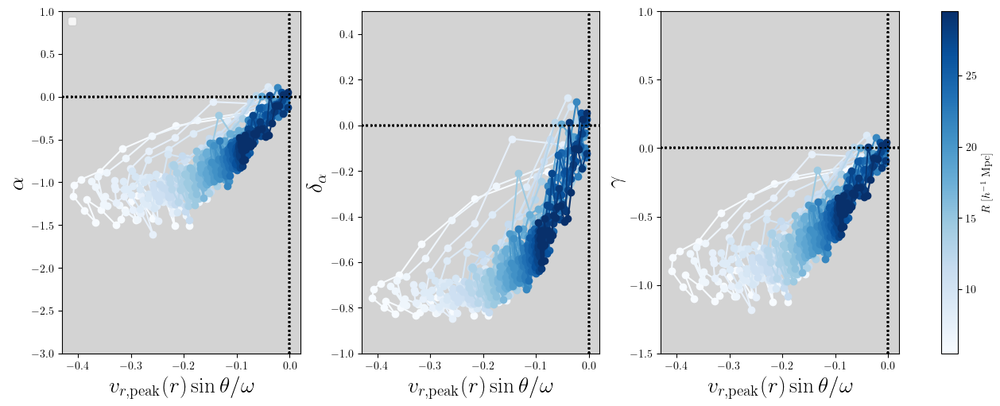

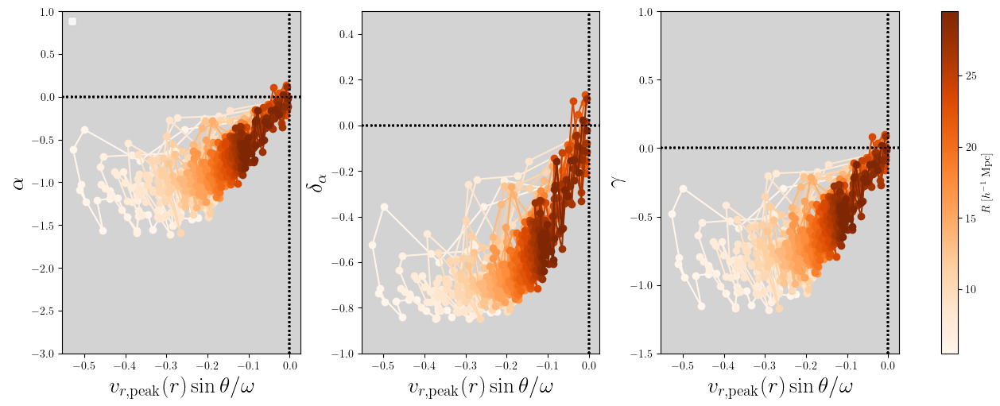

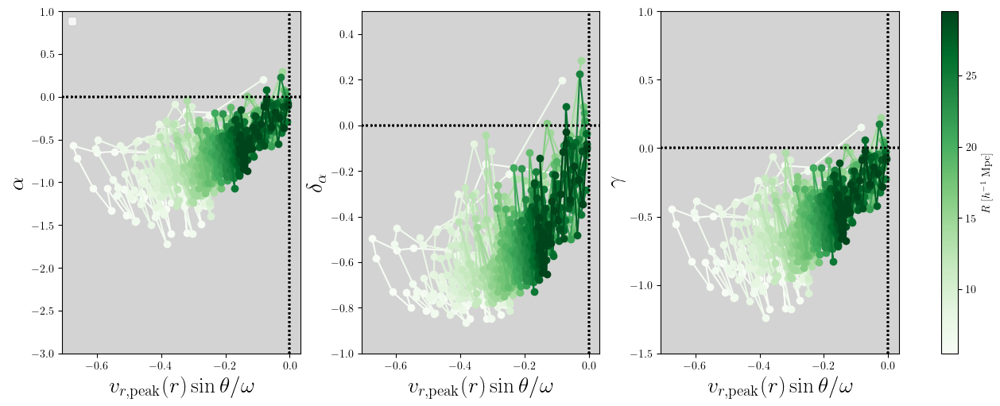

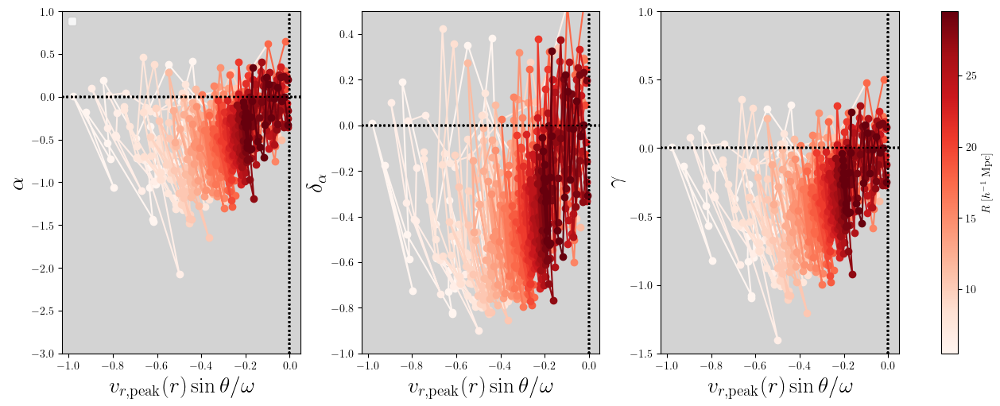

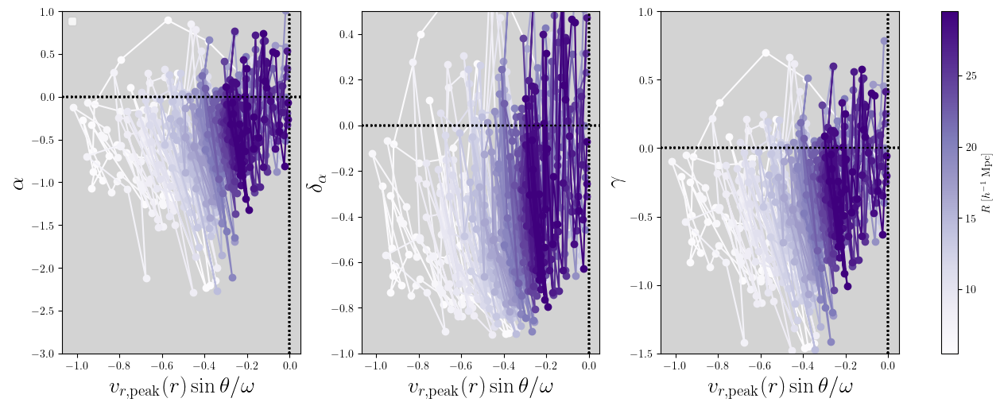

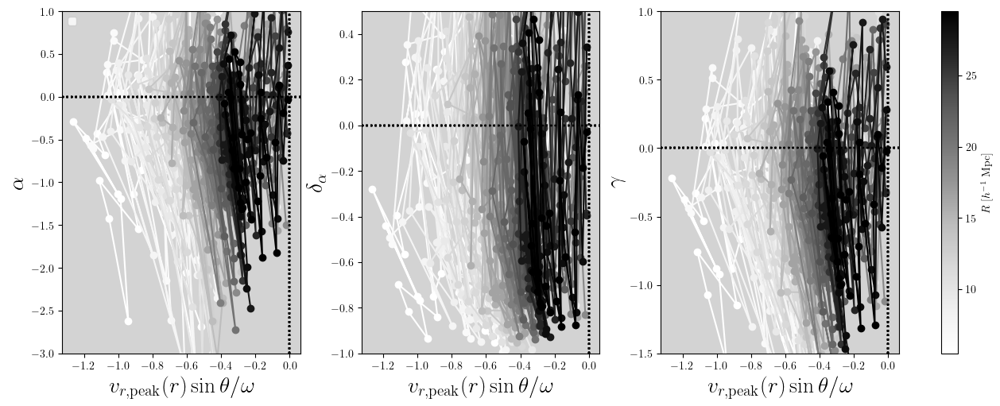

In [19]:
# check how alpha, delta_alpha, and \gamma vary with vrpk sin


from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

colormap_list = [plt.cm.Blues, plt.cm.Oranges, plt.cm.Greens, 
                 plt.cm.Reds, plt.cm.Purples, plt.cm.Greys]

cmaps = [cmap(np.linspace(0, 1, len(r_cens))) for cmap in colormap_list]

def plawc(x, a, b, c):
    return a*x**b + c

names = [r'$\alpha$', r'$\delta_\alpha$', r'$\gamma$']

nu_ind = 2
alphas = STpars[nu_ind, :, :, :, 2]
omegas = STpars[nu_ind, :, :, :, 1]
deltas = alphas / np.sqrt(1+alphas**2)

betanu = np.sqrt(nus[nu_ind]/np.pi) * scipy.special.gamma((nus[nu_ind] - 1)/2)/scipy.special.gamma((nus[nu_ind])/2) 
sigmaz = np.sqrt(nus[nu_ind]/(nus[nu_ind]-2) - (betanu*deltas)**2)
gammas = betanu * deltas * ( (nus[nu_ind]*(3-deltas**2))/(nus[nu_ind] - 3) - (3*nus[nu_ind])/(nus[nu_ind]-2) + 2*(betanu*deltas)**2 ) / sigmaz**3 

sigma_v = np.sqrt(STpars[nu_ind, :, :, :, 1]**2 * sigmaz**2)

sigma_0 = 532 # measured LS LOS dispersion

ys = [alphas, deltas, gammas]

lims = [(-3, 1), (-1, 0.5), (-1.5, 1)]

vpksin = np.zeros((len(Mvirs), len(r_cens), len(rlos_cens)))

alpha_pars = np.zeros((len(Mvirs), 2))
alpha_errs = np.zeros((len(Mvirs), 2))

for k in range(0, len(Mvirs)):
    fig, ax = plt.subplots(1, 3, figsize=(25/2, 5), layout='constrained')
    for j in range(0, len(r_cens)): 
        for i in range(len(names)):
            R = r_cens[j]
            rlos = rlos_cens
            theta = np.arctan2(rlos, R)
            sin = np.sin(theta)
            r = np.sqrt(R**2 + rlos**2)
            #print(r.shape)

            mask = rlos < 30

            mu = RBinterp(np.log10(Mvirs[k]), r).squeeze()*sin

            ax[i].plot((mu/omegas[k, j])[mask], ys[i][k, j][mask], c=cmaps[k][j], marker='o') #(np.sqrt(sigma_0**2 - sigma_v[k, j]**2))
            #ax[i].plot(STpars[nu_ind, k, j, :, 0]/sigma_v[k, j], ys[i][k, j], c=cmaps[k][j], marker='o')

            if i == 0:
                vpksin[k, j] = RBinterp(np.log10(Mvirs[k]), r).squeeze()*sin

            ax[i].set_xlabel(r"$v_{r, \rm peak}(r)\sin\theta / \omega $", fontsize=20)
            #ax[i].set_xlabel(r"$\xi/\sigma_v$", fontsize=20)

            ax[i].set_ylabel(names[i], fontsize=20)
            ax[i].set_facecolor('lightgray')
            ax[i].set_ylim(lims[i])
            ax[i].axhline(0, ls=':', c='k')
            ax[i].axvline(0, ls=':', c='k')
            #ax[i].set_xlim((-50, 5))
            #ax[i].set_xlim((-1.0, 0.1))
    
    #p, c = curve_fit(lambda x, m: line(x, m, 0), vpksin[k].flatten(), alphas[k].flatten(), maxfev=10_000)
    xs = np.linspace(vpksin[k].min(), vpksin[k].max(), 100)
    #ax[0].plot(xs, line(xs, p, 0), ls='-', c='r')

    p, c = curve_fit(lambda x, A, B: A*(-x)**B, vpksin[k].flatten(), alphas[k].flatten(), p0=[-0.1, 0.5], maxfev=10_000)
    alpha_pars[k] = p
    alpha_errs[k] = np.sqrt(np.diag(c))
    #ax[0].plot(xs, p[0]*(-xs)**p[1], ls='-', c='g', label='Direct power law fit')
    #P = alpha_mpars[0, 0]*(Mvirs[k])**alpha_mpars[0, 1]
    #S = alpha_mpars[1, 0]*(Mvirs[k])**alpha_mpars[1, 1]
    #ax[0].plot(xs, P*(-xs)**S, ls='-', c='r', label='Par. MD power law')
    ax[0].legend()

        #ax[0].axline((0, 0), slope=p, ls='--', c='r')
    #ax[0].plot(np.mean(vpksin[k], axis=1),  np.mean(alphas[k], axis=1), ls='--', c='k')

    # p, c = curve_fit(line, vpksin[k].flatten(), deltas[k].flatten())
    # ax[1].axline((0, p[1]), slope=p[0], ls='--', c='r')

    # p, c = curve_fit(line, vpksin[k].flatten(), gammas[k].flatten())
    # ax[2].axline((0, p[1]), slope=p[0], ls='--', c='r')

    Norm = Normalize(vmin=min(r_cens), vmax=max(r_cens))
    sm = ScalarMappable(norm=Norm, cmap=colormap_list[k])
    sm.set_array([])  # dummy array
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label(r"$R \ [h^{-1}$ Mpc]")

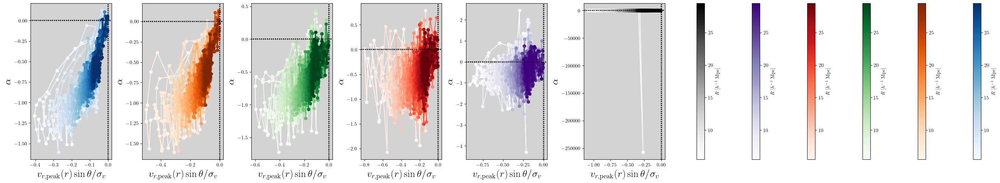

In [26]:
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

colormap_list = [plt.cm.Blues, plt.cm.Oranges, plt.cm.Greens, 
                 plt.cm.Reds, plt.cm.Purples, plt.cm.Greys]

cmaps = [cmap(np.linspace(0, 1, len(r_cens))) for cmap in colormap_list]

def plawc(x, a, b, c):
    return a*x**b + c

names = [r'$\alpha$', r'$\delta_\alpha$', r'$\gamma$']

nu_ind = 2
alphas = STpars[nu_ind, :, :, :, 2]
omegas = STpars[nu_ind, :, :, :, 1]
deltas = alphas / np.sqrt(1+alphas**2)

betanu = np.sqrt(nus[nu_ind]/np.pi) * scipy.special.gamma((nus[nu_ind] - 1)/2)/scipy.special.gamma((nus[nu_ind])/2) 
sigmaz = np.sqrt(nus[nu_ind]/(nus[nu_ind]-2) - (betanu*deltas)**2)
gammas = betanu * deltas * ( (nus[nu_ind]*(3-deltas**2))/(nus[nu_ind] - 3) - (3*nus[nu_ind])/(nus[nu_ind]-2) + 2*(betanu*deltas)**2 ) / sigmaz**3 

sigma_v = np.sqrt(STpars[nu_ind, :, :, :, 1]**2 * sigmaz**2)

sigma_0 = 600 # measured LS LOS dispersion

ys = [alphas, deltas, gammas]

lims = [(-3, 1), (-1, 0.5), (-1.5, 1)]

vpksin = np.zeros((len(Mvirs), len(r_cens), len(rlos_cens)))

alpha_pars = np.zeros((len(Mvirs), 2))
alpha_errs = np.zeros((len(Mvirs), 2))

fig, ax = plt.subplots(1, len(Mvirs), figsize=(5*len(Mvirs), 5), layout='constrained')

for k in range(0, len(Mvirs)):
    for j in range(0, len(r_cens)): 
        #for i in range(len(names)):
        R = r_cens[j]
        rlos = rlos_cens
        theta = np.arctan2(rlos, R)
        sin = np.sin(theta)
        r = np.sqrt(R**2 + rlos**2)

        mask = rlos < 60

        mu = RBinterp(np.log10(Mvirs[k]), r).squeeze()*sin

        ax[k].plot((mu/sigma_v[k, j]), alphas[k, j], c=cmaps[k][j], marker='o')
        #ax[k].plot(STpars[nu_ind, k, j, :, 0]/sigma_v[k, j], ys[i][k, j], c=cmaps[k][j], marker='o')

        if i == 0:
            vpksin[k, j] = RBinterp(np.log10(Mvirs[k]), r).squeeze()*sin

        ax[k].set_xlabel(r"$v_{r, \rm peak}(r)\sin\theta/\sigma_v $", fontsize=20)
        #ax[k].set_xlabel(r"$\xi/\sigma_v$", fontsize=20)

        ax[k].set_ylabel(r'$\alpha$', fontsize=20)
        ax[k].set_facecolor('lightgray')
        #ax[k].set_ylim(lims[i])
        ax[k].axhline(0, ls=':', c='k')
        ax[k].axvline(0, ls=':', c='k')
        #ax[k].set_xlim((-400, 25))
        #ax[k].set_xlim((-1.0, 0.1))
    
    #p, c = curve_fit(lambda x, m: line(x, m, 0), vpksin[k].flatten(), alphas[k].flatten(), maxfev=10_000)
    #xs = np.linspace(vpksin[k].min(), vpksin[k].max(), 100)
    #ax[0].plot(xs, line(xs, p, 0), ls='-', c='r')
    #ax[0].legend()


    Norm = Normalize(vmin=min(r_cens), vmax=max(r_cens))
    sm = ScalarMappable(norm=Norm, cmap=colormap_list[k])
    sm.set_array([])  # dummy array
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label(r"$R \ [h^{-1}$ Mpc]")

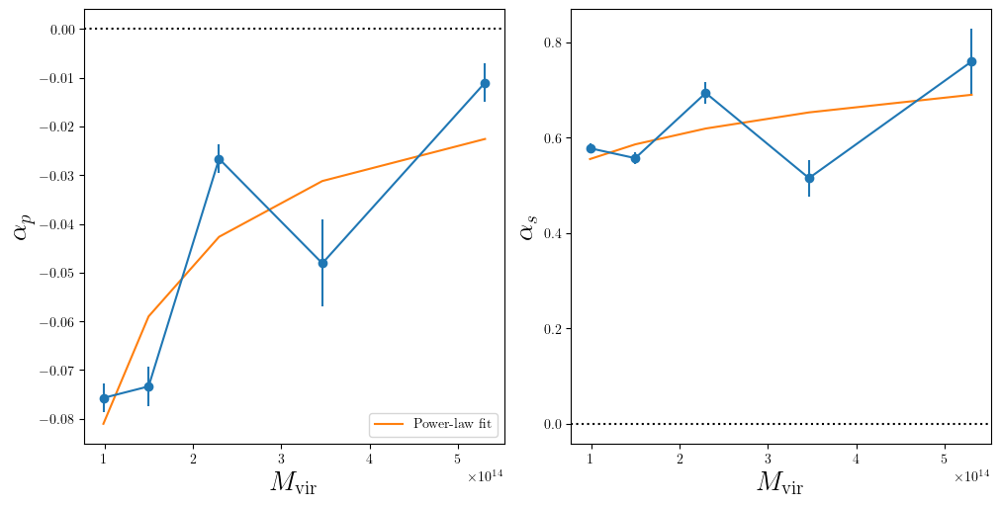

In [110]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5), layout='constrained')

names = [r'$\alpha_p$', r'$\alpha_s$', r'$\alpha_c$']

alpha_means = np.mean(alpha_pars[:-1], axis=0)
alpha_mpars = np.zeros((2, 2))

for i in range(2):
    ax[i].errorbar(Mvirs[:-1], alpha_pars[:-1, i], yerr=alpha_errs[:-1, i], marker='o', ls='-')
    p, c = curve_fit(lambda x, A, B: A*(x)**B, Mvirs[:-1], np.sign(alpha_pars[:-1, i])*alpha_pars[:-1, i], p0=[-0.1, 0.5], maxfev=10_000)
    ax[i].plot(Mvirs[:-1], np.sign(alpha_pars[:-1, i])*p[0]*(Mvirs[:-1])**p[1], ls='-', c='C1', label='Power-law fit')

    alpha_mpars[i] = p

    ax[i].set_xlabel(r"$M_{\rm vir}$", fontsize=20)
    ax[i].set_ylabel(names[i], fontsize=20)
    #ax[i].set_facecolor('lightgray')
    ax[i].axhline(0, ls=':', c='k')
    #ax[i].axhline(np.mean(alpha_pars[:-1, i]), ls='-', c='C1')

ax[0].legend()
alpha_mpars[0, 0] = -1*alpha_mpars[0, 0]

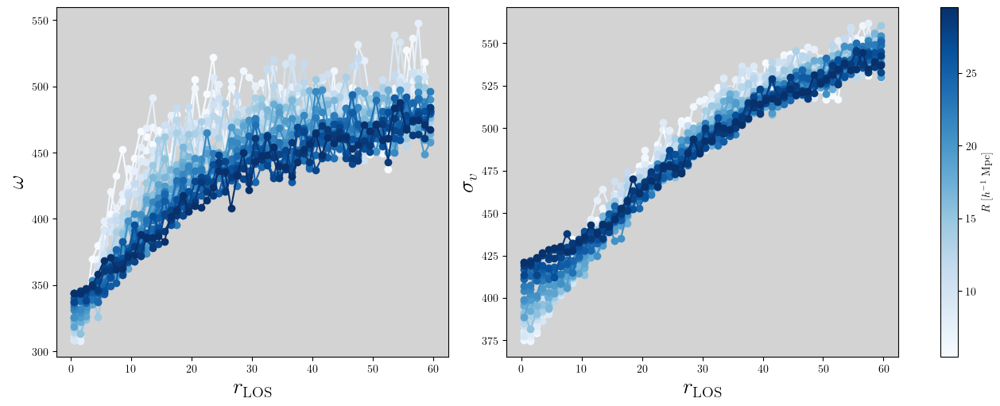

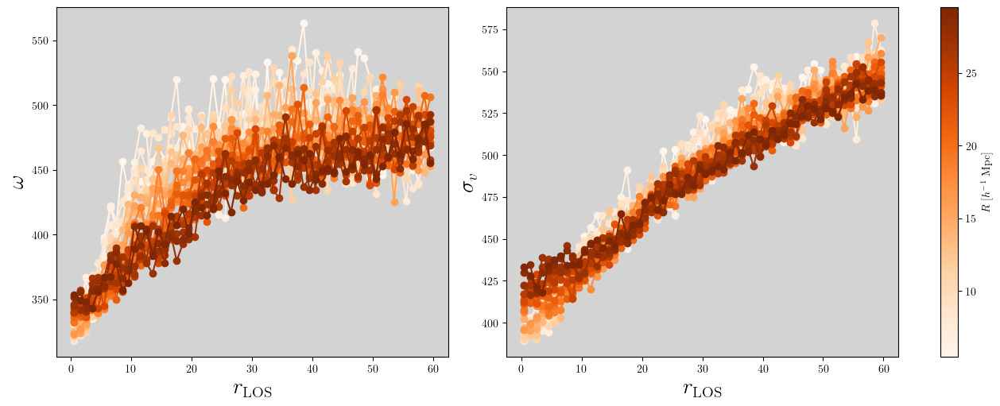

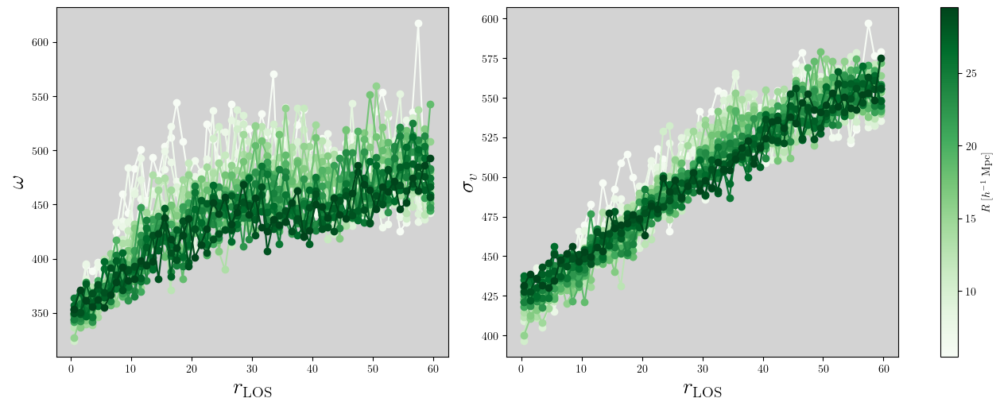

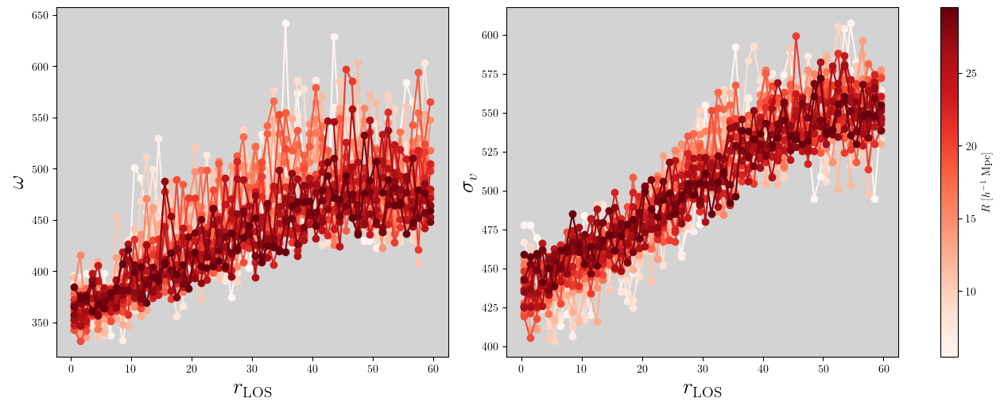

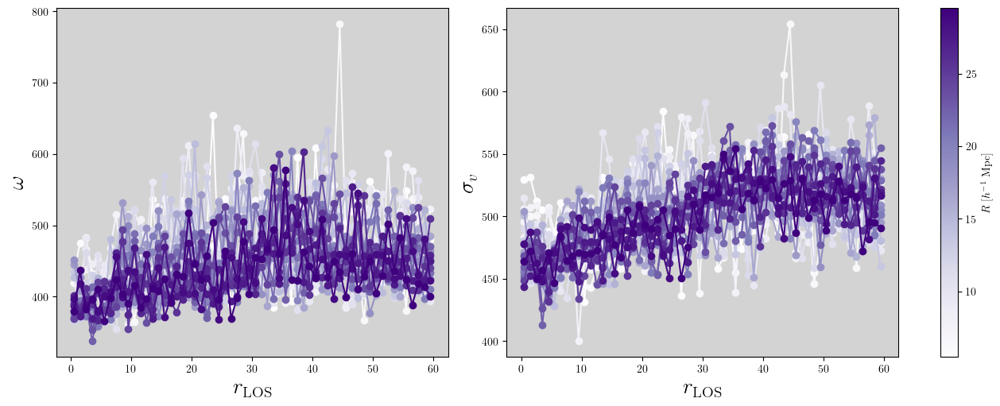

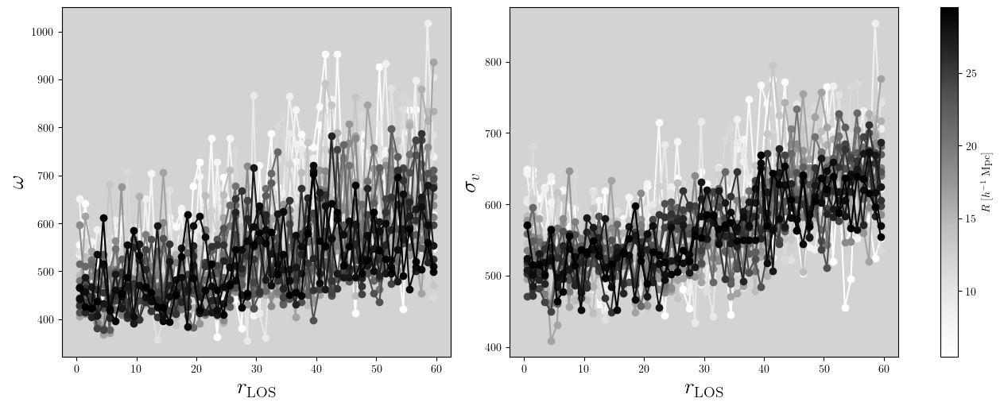

In [40]:
# check how \omega and \sigma vary with r


from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

colormap_list = [plt.cm.Blues, plt.cm.Oranges, plt.cm.Greens, 
                 plt.cm.Reds, plt.cm.Purples, plt.cm.Greys]

cmaps = [cmap(np.linspace(0, 1, len(r_cens))) for cmap in colormap_list]

def plawc(x, a, b, c):
    return a*x**b + c


nu_ind = 2
alphas = STpars[nu_ind, :, :, :, 2]
omegas = STpars[nu_ind, :, :, :, 1]
deltas = alphas / np.sqrt(1+alphas**2)

betanu = np.sqrt(nus[nu_ind]/np.pi) * scipy.special.gamma((nus[nu_ind] - 1)/2)/scipy.special.gamma((nus[nu_ind])/2) 
sigmaz = np.sqrt(nus[nu_ind]/(nus[nu_ind]-2) - (betanu*deltas)**2)
gammas = betanu * deltas * ( (nus[nu_ind]*(3-deltas**2))/(nus[nu_ind] - 3) - (3*nus[nu_ind])/(nus[nu_ind]-2) + 2*(betanu*deltas)**2 ) / sigmaz**3 

sigma_v = np.sqrt(STpars[nu_ind, :, :, :, 1]**2 * sigmaz**2)

ys = [omegas, sigma_v]
names = [r'$\omega$', r'$\sigma_v$']


lims = [(-3, 1), (-1, 0.5), (-1.5, 1)]

vpksin = np.zeros((len(Mvirs), len(r_cens), len(rlos_cens)))

for k in range(0, len(Mvirs)):
    fig, ax = plt.subplots(1, 2, figsize=(25/2, 5), layout='constrained')
    for j in range(0, len(r_cens)): 
        for i in range(len(names)):
            R = r_cens[j]
            rlos = rlos_cens
            theta = np.arctan2(rlos, R)
            sin = np.sin(theta)
            r = np.sqrt(R**2 + rlos**2)
            #print(r.shape)

            ax[i].plot(rlos, ys[i][k, j], c=cmaps[k][j], marker='o')
            #ax[i].plot(STpars[nu_ind, k, j, :, 0]/sigma_v[k, j], ys[i][k, j], c=cmaps[k][j], marker='o')

            #if i == 0:
            #    vpksin[k, j] = RBinterp(np.log10(Mvirs[k]), r).squeeze()*sin

            ax[i].set_xlabel(r"$r_{\rm LOS}$", fontsize=20)
            ax[i].set_ylabel(names[i], fontsize=20)
            ax[i].set_facecolor('lightgray')
            #ax[i].set_ylim(lims[i])
            #ax[i].set_xlim((-400, 25))
    
    # p, c = curve_fit(plawc, vpksin[k].flatten(), -alphas[k].flatten(), maxfev=10_000)
    # xs = np.linspace(vpksin[k].min(), vpksin[k].max(), 100)
    #ax[0].plot(np.mean(vpksin[k], axis=1),  np.mean(alphas[k], axis=1), ls='--', c='k')

    # p, c = curve_fit(line, vpksin[k].flatten(), deltas[k].flatten())
    # ax[1].axline((0, p[1]), slope=p[0], ls='--', c='r')

    # p, c = curve_fit(line, vpksin[k].flatten(), gammas[k].flatten())
    # ax[2].axline((0, p[1]), slope=p[0], ls='--', c='r')

    Norm = Normalize(vmin=min(r_cens), vmax=max(r_cens))
    sm = ScalarMappable(norm=Norm, cmap=colormap_list[k])
    sm.set_array([])  # dummy array
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label(r"$R \ [h^{-1}$ Mpc]")

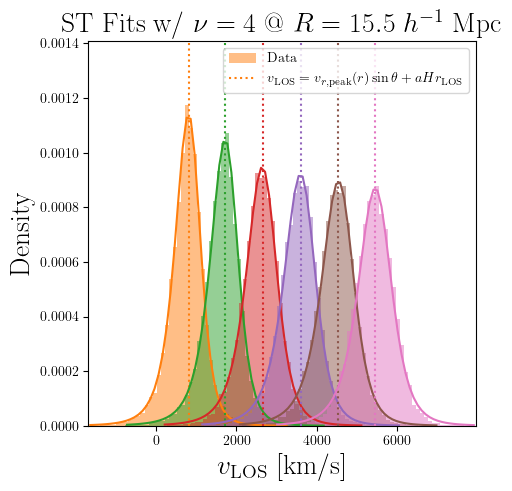

In [102]:
# test fit to P(vlos|R, rlos)
i, j, k = 10, 10, 0

rlos_inds = [9, 19, 29, 39, 49, 59]

plt.figure(figsize=(5, 5))

for i in rlos_inds:
    index = i + j*len(rlos_cens) + (k//5)*len(r_cens)*len(rlos_cens)

    r = np.sqrt(r_cens[j]**2 + rlos_cens[i]**2)
    theta = np.arctan2(rlos_cens[i], r_cens[j])
    sin = np.sin(theta)


    peak = interps[k](r)*sin + a*H*rlos_cens[i]/h

    ve = np.linspace(peak-2500, peak+2500, 50+1)
    vc = 0.5*(ve[1:] + ve[:-1])

    hist, edges = np.histogram(vphyslos1[index], bins=ve, density=True)
    cent = 0.5*(edges[1:] + edges[:-1])

    test_hist, bins, _ = plt.hist(vphyslos1[i + j*len(rlos_cens) + k*len(r_cens)*len(rlos_cens)], bins=ve, density=True, alpha=0.5, label='Data', color=f'C{i//9}')
    cens = 0.5*(bins[1:] + bins[:-1])

    plt.plot(cens, skewed_t_pdf(cens-a*H*rlos_cens[i]/h, STpars[0, k, j, i, 0], STpars[0, k, j, i, 1], STpars[0, k, j, i, 2], nus[0]), c=f'C{i//9}')

    plt.axvline(peak, label=r"$v_{\rm LOS} = v_{r, \rm peak}(r)\sin\theta + aHr_{\rm LOS}$", color=f'C{i//9}', ls=':')

    plt.title(rf"ST Fits w/ $\nu={nus[0]}$ @ $R = {r_cens[j]}$ $h^{{-1}}$ Mpc ", fontsize=20)
    plt.xlabel(r"$v_{\rm LOS}$ [km/s]", fontsize=20)
    plt.ylabel(r"Density", fontsize=20)
    plt.margins(x=0) 

    if i == rlos_inds[0]:
        plt.legend()
        plt.ylim((0, 1.2*np.max(hist)))

In [104]:
def P_R_ind_ST(vlos, R_ind, M_ind):
    R = r_cens[R_ind]
    M = Mvirs[M_ind]

    rho_g = 0.014  # h^3 Mpc^-3 mean galaxy number density in MDPL2

    rlos_con = np.concatenate((-np.flip(rlos_cens), rlos_cens))


    Pvlos_interp_list = []

    for i in range(len(rlos_cens)):
        r = np.sqrt(R**2 + rlos_cens[i]**2)
        theta = np.arctan2(rlos_cens[i], R)
        sin = np.sin(theta)

        peak = interps[M_ind](r)*sin + a*H*rlos_cens[i]/h
        ve = np.linspace(peak - 2500, peak + 2500, 100+1)
        vc = 0.5*(ve[1:] + ve[:-1])

        Pvlos = skewed_t_pdf(vc-a*H*rlos_cens[i]/h, STpars[0, M_ind, R_ind, i, 0], STpars[0, M_ind, R_ind, i, 1], STpars[0, M_ind, R_ind, i, 2], nus[0])#norm.pdf(vc, loc=peak, scale=Gfixpars[M_ind, R_ind, i, 1])

        interp_func = interp1d(
            vc, Pvlos, kind="cubic", bounds_error=False, fill_value=0.0
        )
        interpolated = interp_func(vlos[:, None])

        Pvlos_interp_list.append(interpolated)

    Pvlos_interp = np.array(Pvlos_interp_list).reshape(len(rlos_cens), len(vlos))
    Pvlos_interp = Pvlos_interp.T

    rlos_fine = np.linspace(rlos_cens[0], rlos_cens[-1]+20, 500)
    rlos_con_fine = np.concatenate((-np.flip(rlos_fine), rlos_fine))#np.linspace(rlos_con[0], rlos_con[-1], 200)

    r3d = np.sqrt(R**2 + rlos_fine**2)
    weight = rho_g * (cf_inf(r3d, M, jocond.myconfig.cf_pars) + 1)  

    Pvlos_interp2 = interp1d(rlos_cens, Pvlos_interp, kind='linear', axis=1, bounds_error=False, fill_value=0.0)(rlos_fine)

    integrand = Pvlos_interp2 * weight[None, :] 

    integrand = np.concatenate((np.flip(integrand, axis=(0, 1)), integrand), axis=1)

    #print(integrand.shape, Pvlos_interp.shape, Pvlos_interp2.shape, weight.shape, rlos_con_fine.shape)

    P_out = simpson(integrand, x=rlos_con_fine, axis=1)

    return P_out / np.sum(P_out * np.diff(vlos)[0])

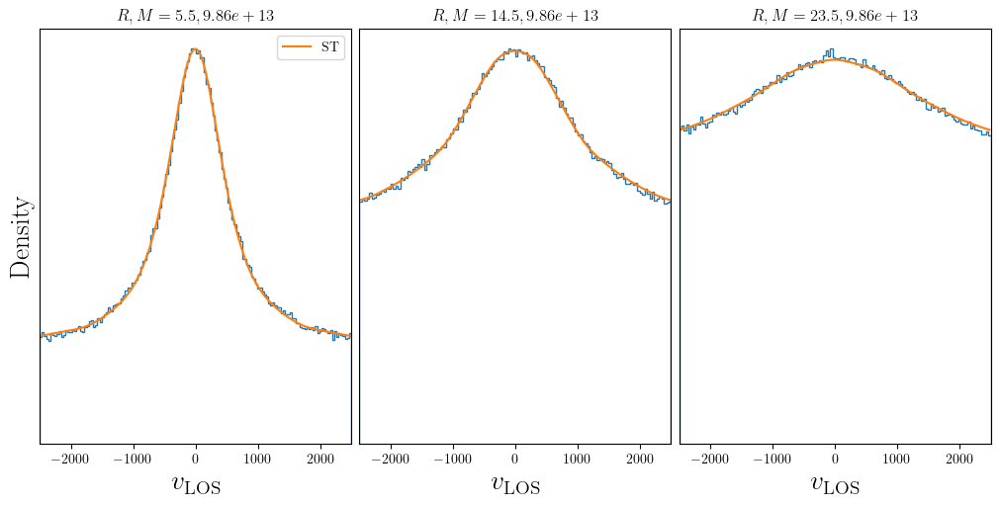

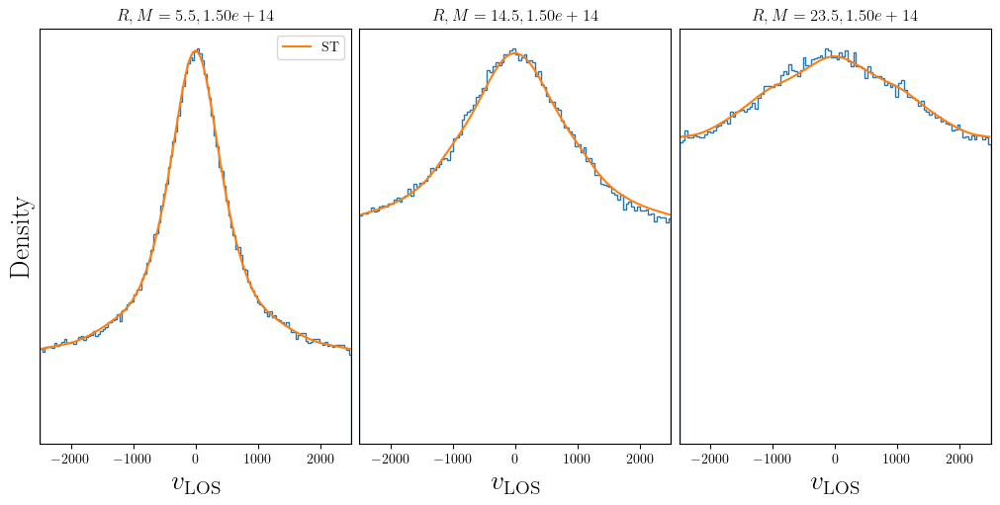

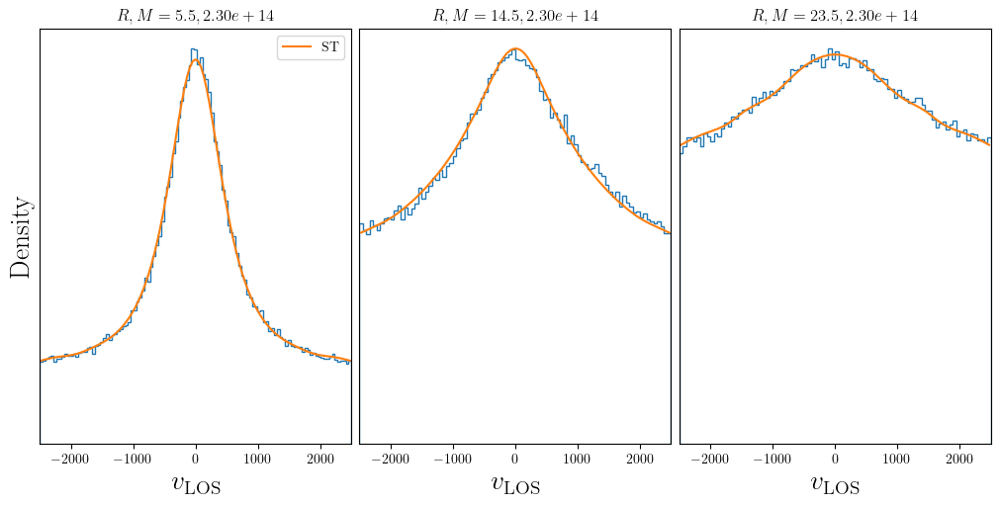

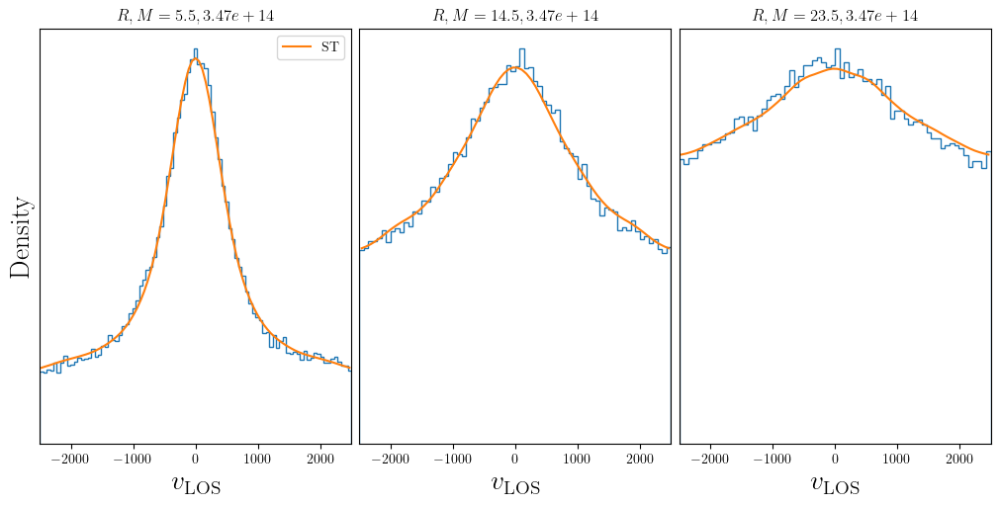

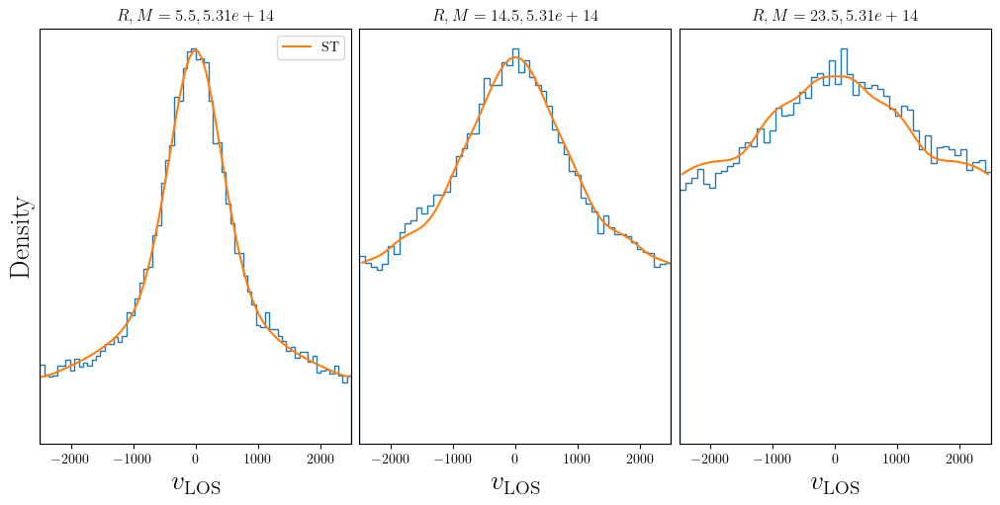

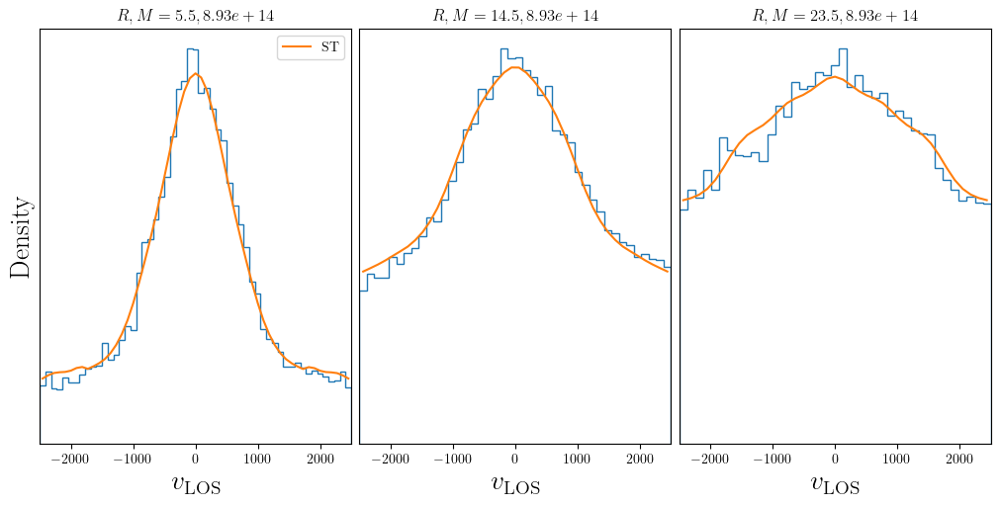

In [105]:
j, k = 0, 0

for k in range(len(Mvirs)):
    fig, ax = plt.subplots(1, len(r_cens)//7, figsize=(10, 5), layout='constrained')
    for j in range(0, len(r_cens), 9):
        index = j + k*len(r_cens)

        hist, bins, _ = ax[j//7].hist(vphyslos[index], range=[-2500, 2500], bins='auto', density=True, histtype='step')
        cent = 0.5*(bins[1:] + bins[:-1])

        # ax[j//7].plot(cent, P_R_ind_free(cent, j, k), label='Free', c='C1')
        # ax[j//7].plot(cent, P_R_ind_fix(cent, j, k), label='Fixed peak', ls='--', c='C1')

        ax[j//7].plot(cent, P_R_ind_ST(cent, j, k), label='ST', c='C1')


        ax[j//7].set_xlabel(r"$v_{\rm LOS}$", fontsize=20)
        ax[j//7].set_yticks([])
        ax[j//7].margins(x=0)
        ax[j//7].set_title(rf"$R, M = {r_cens[j]}, {Mvirs[k]:.2e}$")

    ax[0].legend()
    ax[0].set_ylabel(r"Density", fontsize=20)


In [107]:
len(r_cens)

25

In [13]:
def Erf(x, A, s, b):

    return A*scipy.special.erf(x/s) + b

def zw_rad(x, q, p, m, b):

    return q - p * x / ( x + m )**b

def rhml_rad(x, q, h, m, b):
    
    return q - h*(x/m) * ( b * m / ( x + (b-1)*m ) )**b

 

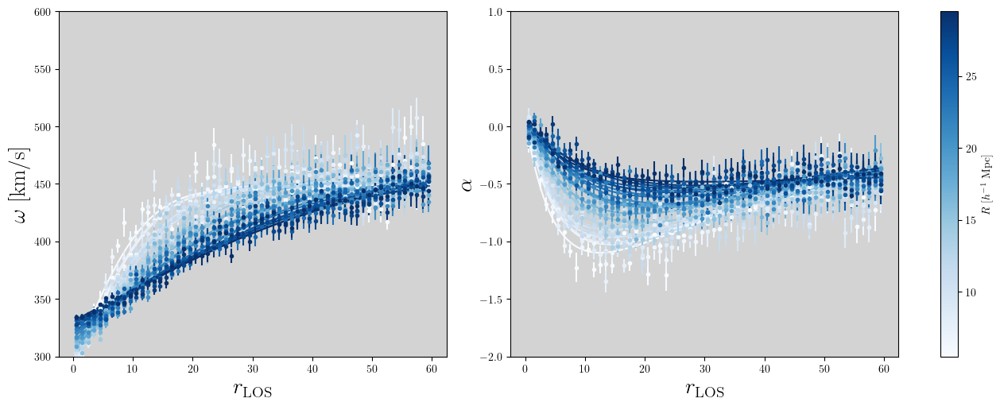

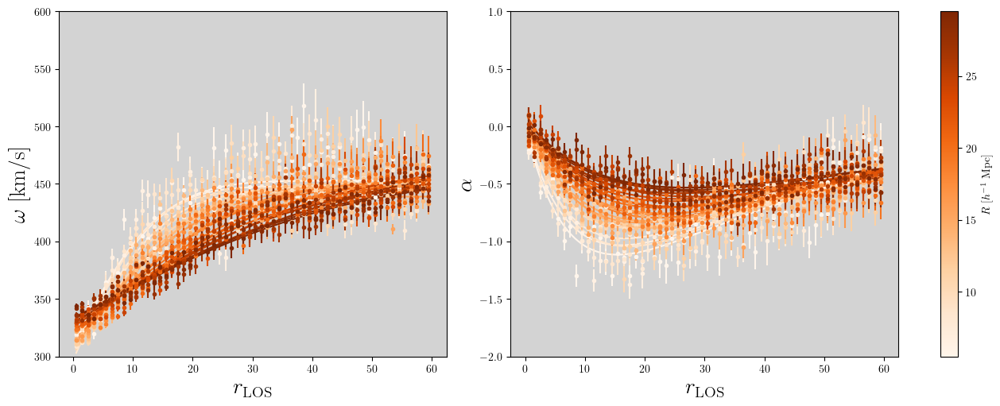

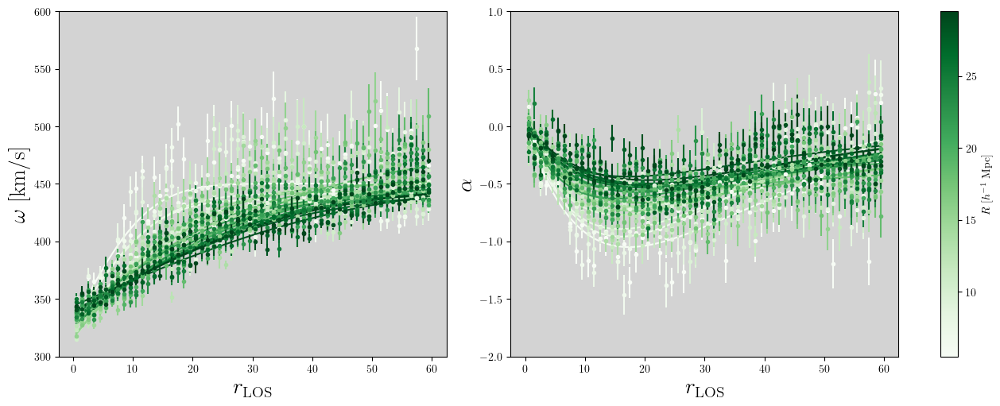

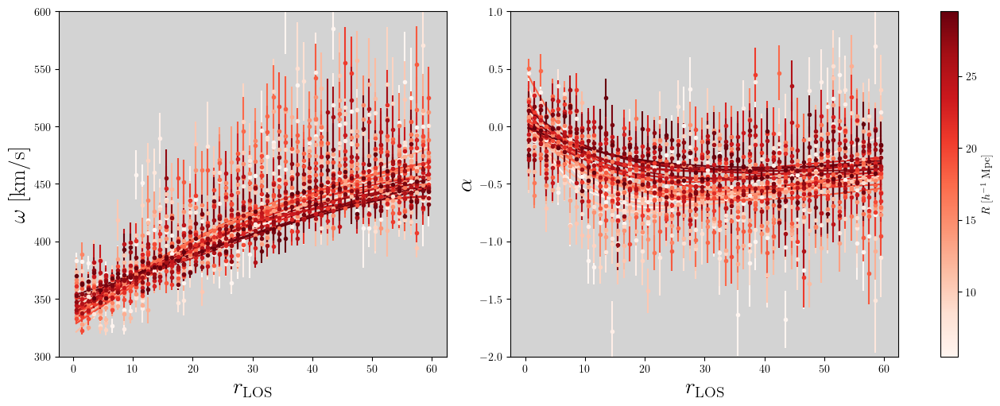

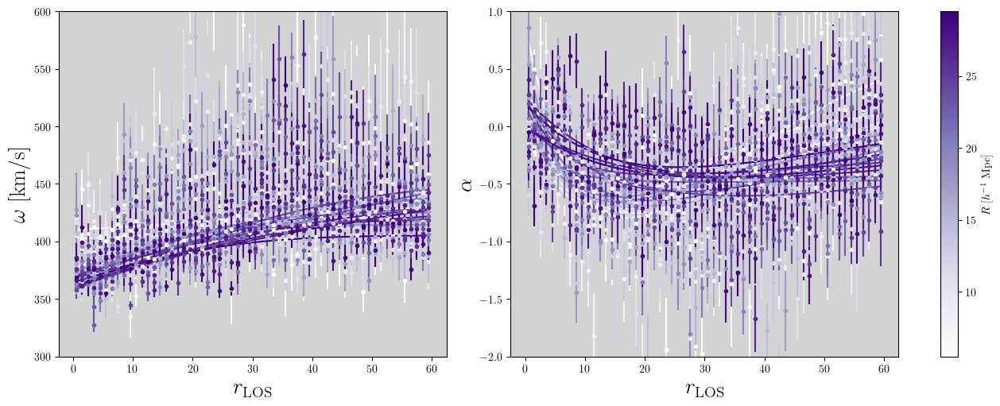

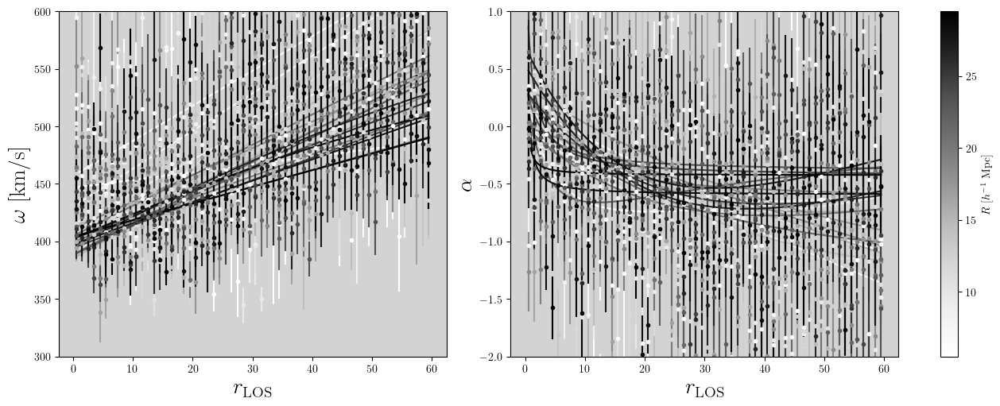

In [13]:
# Fit omega, alpha rlos, M dependence

from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

colormap_list = [plt.cm.Blues, plt.cm.Oranges, plt.cm.Greens, 
                 plt.cm.Reds, plt.cm.Purples, plt.cm.Greys]

cmaps = [cmap(np.linspace(0, 1, len(r_cens))) for cmap in colormap_list]

names = [r'$\xi$ [km/s]', r'$\omega$ [km/s]', r'$\alpha$', r'$\nu$']

lims = [(-500, 50), (300, 600), (-2, 1), (-0.05, 0.15)]

w_pars = np.zeros((len(Mvirs), len(r_cens), 3))
w_errs = np.zeros(w_pars.shape)

a_pars = np.zeros((len(Mvirs), len(r_cens), 4))
a_errs = np.zeros(a_pars.shape)


for k in range(0, len(Mvirs)):
    fig, ax = plt.subplots(1, 2, figsize=(25/2, 5), layout='constrained')
    for j in range(0, len(r_cens)): 
        #for i in range(1, len(names)-1):
        i = 1

        rs = np.linspace(rlos_cens[0], rlos_cens[-1], 1000)

        #ax[i-1].plot(rlos_cens, STpars[0, k, j, :, i], c=cmaps[k][j], marker='o', markersize=3)
        ax[i-1].errorbar(rlos_cens, STpars[0, k, j, :, i], STerrs[0, k, j, :, i], color=cmaps[k][j], fmt='o', markersize=3)

        
        w_fit, w_c = curve_fit(Erf, rlos_cens, STpars[0, k, j, :, i], sigma=STerrs[0, k, j, :, i], p0=[140, 20, 300], bounds=([0, 0, 250], [1e3, 1e3, 500]))
        ax[i-1].plot(rs, Erf(rs, w_fit[0], w_fit[1], w_fit[2]), color=cmaps[k][j])

        
        w_pars[k, j] = w_fit
        w_errs[k, j] = np.sqrt(np.diag(w_c))

        ax[i-1].set_facecolor('lightgray')
        ax[i-1].set_xlabel(r"$r_{\rm LOS}$", fontsize=20)
        ax[i-1].set_ylabel(names[i], fontsize=20)
        ax[i-1].set_ylim(lims[i])

        i = 2
        ax[i-1].errorbar(rlos_cens, STpars[0, k, j, :, i], STerrs[0, k, j, :, i], color=cmaps[k][j], fmt='o', markersize=3)

        #try:

        a_p, c = curve_fit(rhml_rad, rlos_cens, STpars[0, k, j, :, i], sigma=STerrs[0, k, j, :, i], p0=[0.04906177 , 1.14641561, 12.51124666,  3.11980491], maxfev=50_000, bounds=((0, 1e-2, 1e-5, 1e-2), (10, 1e3, 1e3, 1e4)) ) # 
        #print(i, j, k, a_p)
        ax[i-1].plot(rs, rhml_rad(rs, a_p[0], a_p[1], a_p[2], a_p[3]), color=cmaps[k][j])
        #ax[i-1].plot(rs, rhml_rad(rs, 0.1, 1, 1, 1), color=cmaps[k][j], ls='--')
        
        a_pars[k, j] = a_p
        a_errs[k, j] = np.sqrt(np.diag(c))
        
        #except RuntimeError:
        #print(f"Couldn't find fit for k, j, i:{k}, {j}, {i}")

        #a_pars[k, j] = np.nan
        #a_pars[k, j] = np.nan

        ax[i-1].set_xlabel(r"$r_{\rm LOS}$", fontsize=20)
        ax[i-1].set_ylabel(names[i], fontsize=20)
        ax[i-1].set_ylim(lims[i])

        ax[i-1].set_facecolor('lightgray')

    Norm = Normalize(vmin=min(r_cens), vmax=max(r_cens))
    sm = ScalarMappable(norm=Norm, cmap=colormap_list[k])
    sm.set_array([])  # dummy array
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label(r"$R \ [h^{-1}$ Mpc]")


omega_A:  132.03586538788312
omega_sigma line:  [2.67719919 0.86152267]


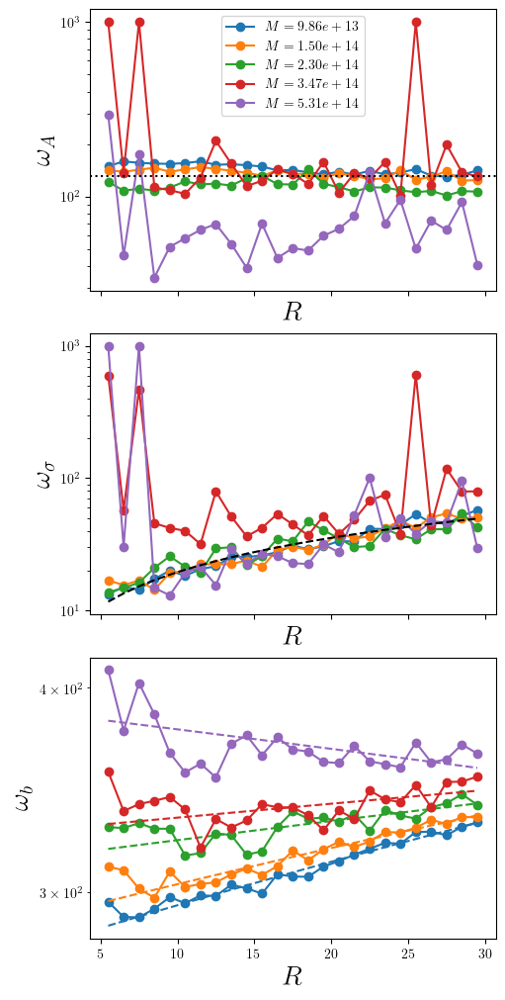

In [16]:
fig, ax = plt.subplots(3, figsize=(5, 10), layout='constrained', sharex=True)

names =[r"$\omega_A$", r"$\omega_\sigma$", r"$\omega_b$"]

w_b_pars = np.zeros((len(Mvirs)-1, 2))
w_b_errs = np.zeros(w_b_pars.shape)

for i in range(3):
    for k in range(len(Mvirs)-1):
        mask = w_pars[k, :, i] < np.inf

        if i == 2:
            p, c = curve_fit(line, r_cens, w_pars[k, :, i], sigma=w_errs[k, :, i], p0=[0, np.mean(w_pars[k, :, i])], maxfev=10_000)
            ax[i].plot(r_cens, line(r_cens, p[0], p[1]), c=f"C{k}", ls='--')

            w_b_pars[k] = p
            w_b_errs[k] = np.sqrt(np.diag(c))

        ax[i].plot(r_cens[mask], w_pars[k, :, i][mask], marker='o', c=f"C{k}", label=rf"$M={Mvirs[k]:.2e}$")
        ax[i].set_xlabel(r"$R$", fontsize=20)
        #ax[i].set_title(rf"$M={Mvirs[k]:.2e}$", fontsize=20) 
        ax[i].set_yscale('log')

        # if i ==0:
        #     ax[i].set_ylim((100, 200))

    ax[i].set_ylabel(names[i], fontsize=20)

ax[0].legend()

ax[0].axhline(np.mean(w_pars[0:-3, :, 0][w_pars[0:-3, :, 0] < 1e3]), c='k', ls=':')
print("omega_A: ", np.mean(w_pars[0:-3, :, 0][w_pars[0:-3, :, 0] < 1e3]))

p, c = curve_fit(plaw, np.tile(r_cens, len(Mvirs)-3), w_pars[0:-3, :, 1].flatten(), p0=[0, np.mean(w_pars[0:-3, :, 1])], maxfev=10_000)
ax[1].plot(r_cens, plaw(r_cens, p[0], p[1]), c='k', ls='--')
print("omega_sigma line: ", p)



omega_b_m plaw:  [ 1.89826428 -0.82055837]
omega_b_b plaw:  [2.73658808e+02 1.65323737e-01]


Text(0, 0.5, '$\\omega_{b, b}$')

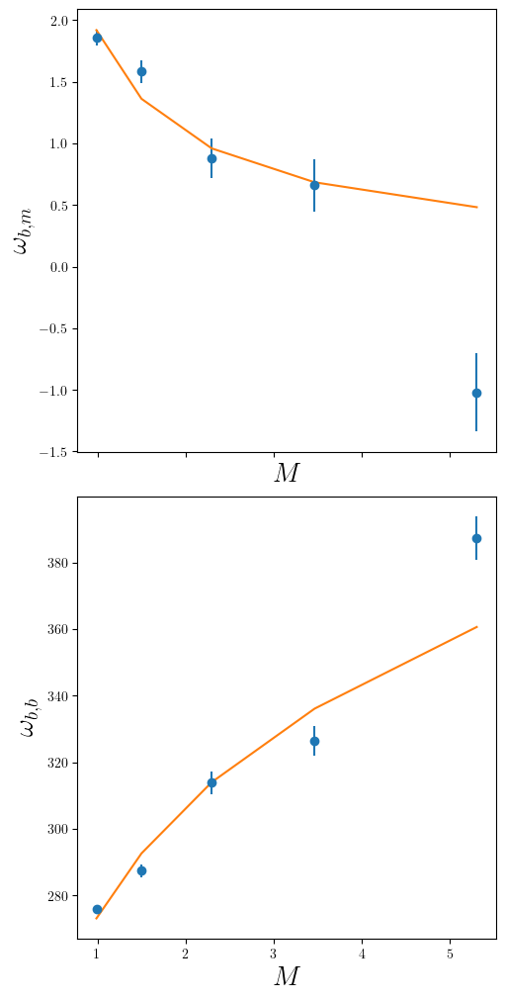

In [17]:
fig, ax = plt.subplots(2,1, figsize=(5, 10), layout='constrained', sharex=True)

ax[0].errorbar(Mvirs[:-1]/1e14, w_b_pars[:, 0], w_b_errs[:, 0], fmt='o')
ax[0].set_xlabel(r"$M$", fontsize=20)
ax[0].set_ylabel(r"$\omega_{b, m}$", fontsize=20)
p, c = curve_fit(plaw, Mvirs[:-1]/1e14, w_b_pars[:, 0], sigma=w_b_errs[:, 0])
print("omega_b_m plaw: ", p)

ax[0].plot(Mvirs[:-1]/1e14, plaw(Mvirs[:-1]/1e14, p[0], p[1]))

ax[1].errorbar(Mvirs[:-1]/1e14, w_b_pars[:, 1], w_b_errs[:, 1], fmt='o')
p, c = curve_fit(plaw, Mvirs[:-1]/1e14, w_b_pars[:, 1], sigma=w_b_errs[:, 1])
print("omega_b_b plaw: ", p)

ax[1].plot(Mvirs[:-1]/1e14, plaw(Mvirs[:-1]/1e14, p[0], p[1]))

ax[1].set_xlabel(r"$M$", fontsize=20)
ax[1].set_ylabel(r"$\omega_{b, b}$", fontsize=20)

alpha_q:  0.10291071585361544
alpha_h line:  [-0.0233699   1.16263577]
alpha_m line:  [ 0.53030107 13.56176293]
alpha_b:  5.279556261331014


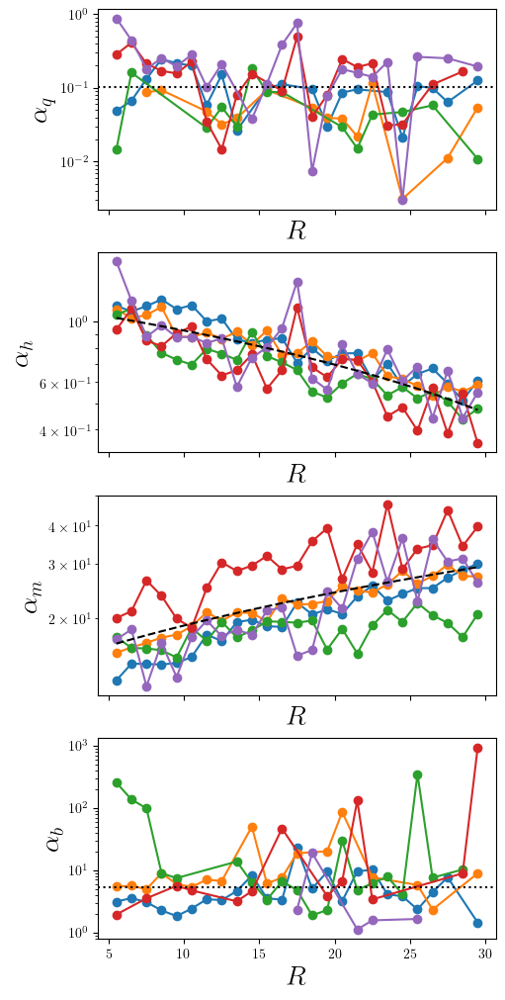

In [ ]:
fig, ax = plt.subplots(4, figsize=(5, 10), layout='constrained', sharex=True)

names =[r"$\alpha_q$", r"$\alpha_h$", r"$\alpha_m$", r"$\alpha_b$"]

for i in range(4):
    for k in range(len(Mvirs)-1):
        mask = (a_pars[k, :, i] > 1e-6) & (a_pars[k, :, i] < 1e3) #10_000_000

        ax[i].plot(r_cens[mask], a_pars[k, :, i][mask], marker='o', c=f"C{k}", label=rf"$M={Mvirs[k]:.2e}$")
        ax[i].set_xlabel(r"$R$", fontsize=20)
        # ax[i].set_title(rf"$M={Mvirs[k]:.2e}$") 
        ax[i].set_yscale('log')

    ax[i].set_ylabel(names[i], fontsize=20)

ax[0].axhline(np.mean(a_pars[0:-2, :, 0][a_pars[0:-2, :, 0] > 1e-6]), c='k', ls=':')
print("alpha_q: ", np.mean(a_pars[0:-2, :, 0][a_pars[0:-2, :, 0] > 1e-6]))

p, c = curve_fit(line, np.tile(r_cens, len(Mvirs)-2), a_pars[0:-2, :, 1].flatten(), p0=[0, np.mean(a_pars[0:-2, :, 1])], maxfev=10_000)
ax[1].plot(r_cens, line(r_cens, p[0], p[1]), c='k', ls='--')
print("alpha_h line: ", p)

p, c = curve_fit(line, np.tile(r_cens, len(Mvirs)-2), a_pars[0:-2, :, 2].flatten(), p0=[0, np.mean(a_pars[0:-2, :, 2])], maxfev=10_000)
ax[2].plot(r_cens, line(r_cens, p[0], p[1]), c='k', ls='--')
print("alpha_m line: ", p)

ax[3].axhline(np.mean(a_pars[0, :, 3][(a_pars[0, :, 3] > 1e-6)&(a_pars[0, :, 3] < 1e3)]), c='k', ls=':')
print("alpha_b: ", np.mean(a_pars[0, :, 3][(a_pars[0, :, 3] > 1e-6)&(a_pars[0, :, 3] < 1e3)]))
#-0.0233, 1.16263577, 0.53030107, 13.56176293,

In [8]:
# define smooth model 

STsm_pars = np.array([132.0358, 2.6771, 0.8615, 1.89826428, -0.82055837, 2.73658808e+02, 1.65323737e-01, 0.10291, -0.0233, 1.16263577, 0.53030107, 13.56176293, 5.279556261331014])

def P_R_smooth(vlos, R, M, pars):
    omA, om_sm, om_sb, om_bmp, om_bms, om_bbp, om_bbs, a_q, a_hm, a_hb, a_mm, a_mb, a_b = pars

    M_p = 1e14

    om_s = line(R, om_sm, om_sb)
    om_bm = plaw(M/M_p, om_bmp, om_bms)
    om_bb = plaw(M/M_p, om_bbp, om_bbs)

    om_b = line(R, om_bm, om_bb)

    a_h = line(R, a_hm, a_hb)
    a_m = line(R, a_mm, a_mb)

    #M_ind = np.where(M == Mvirs)[0][0]

    rho_g = 0.014  # h^3 Mpc^-3 mean galaxy number density in MDPL2

    rlos_max = 60 
    rlos_edges = np.linspace(-rlos_max, rlos_max, int(2*rlos_max + 1))
    rlos_vals = 0.5 * (rlos_edges[1:] + rlos_edges[:-1])

    Pvlos_interp_list = []

    for i in range(len(rlos_vals)):
        r = np.sqrt(R**2 + rlos_vals[i]**2)
        theta = np.arctan2(rlos_vals[i], R)
        sin = np.sin(theta)

        vr_sin = RBinterp(np.log10(M), r).squeeze() * sin #interps[M_ind](r)*sin
        peak = vr_sin + a*H*rlos_vals[i]/h
        ve = np.linspace(peak - 2500, peak + 2500, 100+1)
        vc = 0.5*(ve[1:] + ve[:-1])

        omega = Erf(np.abs(rlos_vals[i]), omA, om_s, om_b)
        alpha = rhml_rad(np.abs(rlos_vals[i]), a_q, a_h, a_m, a_b)

        xi = xi_from_peak_vectorized(modes=vr_sin, omegas=omega, alphas=np.sign(rlos_vals[i])*alpha, nu=nus[0])

        Pvlos = skewed_t_pdf(vc-a*H*rlos_vals[i]/h, xi, omega, np.sign(rlos_vals[i])*alpha, nus[0]) #norm.pdf(vc, loc=peak, scale=Gfixpars[M_ind, R_ind, i, 1])

        interp_func = interp1d(
            vc, Pvlos, kind="linear", bounds_error=False, fill_value=0.0
        )
        interpolated = interp_func(vlos[:, None])

        Pvlos_interp_list.append(interpolated)

    Pvlos_interp = np.array(Pvlos_interp_list).reshape(len(rlos_vals), len(vlos))
    Pvlos_interp = Pvlos_interp.T

    r3d = np.sqrt(R**2 + rlos_vals**2)
    weight = rho_g * (cf_inf(r3d, M, jocond.myconfig.cf_pars) + 1)  

    #Pvlos_interp2 = interp1d(rlos_vals, Pvlos_interp, kind='linear', axis=1, bounds_error=False, fill_value=0.0)(rlos_fine)

    integrand = Pvlos_interp * weight[None, :] 

    #integrand = np.concatenate((np.flip(integrand, axis=(0, 1)), integrand), axis=1)

    #print(integrand.shape, Pvlos_interp.shape, Pvlos_interp2.shape, weight.shape, rlos_con_fine.shape)

    P_out = simpson(integrand, x=rlos_vals, axis=1)

    return P_out / np.sum(P_out * np.diff(vlos)[0])
    


In [7]:
vedges = np.linspace(-2500, 2500, 100+1)
vcens = 0.5*(vedges[1:] + vedges[:-1])

Nv_R = np.zeros((len(Mvirs), len(r_cens), len(vcens)))

for k in range(len(Mvirs)):
    for i in range(len(r_cens)):
        index = i + k*len(r_cens)

        nhist, bins = np.histogram(vphyslos[index], bins=vedges, density=False)
        Nv_R[k, i] = nhist

In [9]:
# fit smooth model to P(v|R, M) simultaneously
from scipy.optimize import brentq
from scipy.optimize import newton

def solve_ST_peak(stpars, init_guess):
    xi, omega, alpha, nu = stpars

    def tau(x):
        return np.sqrt((nu+1)/(nu+x**2))

    def f(z):
        return z - ( (alpha * nu)/(nu + 1) ) * tau(z) * t.pdf(alpha*z*tau(z), df=nu+1) / t.cdf(alpha*z*tau(z), df=nu+1)
    
    soln = fsolve(f, x0=(init_guess-xi)/omega, full_output=True, xtol=1e-18 )

    return xi + omega * soln[0]

def xi_from_peak(mode, omega, alpha, nu):
    """
    Given a known mode and shape parameters, return xi such that
    the skew-t distribution with (xi, omega, alpha, nu) has its peak
    at `mode`.
    """
    # Solve for z* using xi=0 as placeholder — xi cancels out of f(z)
    z_star = solve_ST_peak(stpars=(0.0, omega, alpha, nu), init_guess=1)  # returns xi + omega*z*, with xi=0
    # z_star here is actually omega*z* (since xi=0, the return is 0 + omega*z_star)
    
    # So: xi = mode - omega*z_star (where omega*z_star is what solve_ST_peak returned)
    return mode - z_star

def xi_from_peak_vectorized(modes, omegas, alphas, nu):
    """
    Vectorized version: solve for xi across all (mode, omega, alpha) combinations
    for a fixed nu.
    
    Parameters
    ----------
    modes  : array, shape (N,) or broadcastable
    omegas : array, shape (N,) or broadcastable  
    alphas : array, shape (N,) or broadcastable
    nu     : scalar (fixed)

    Returns
    -------
    xis : array of xi values
    """
    modes  = np.asarray(modes,  dtype=float)
    omegas = np.asarray(omegas, dtype=float)
    alphas = np.asarray(alphas, dtype=float)

    # Broadcast all to a common shape
    modes, omegas, alphas = np.broadcast_arrays(modes, omegas, alphas)
    shape = modes.shape
    
    # Flatten for vectorized solver
    modes_f  = modes.ravel()
    omegas_f = omegas.ravel()
    alphas_f = alphas.ravel()

    # Precompute the constant factor that appears in f(z)
    # f(z) = z - C * tau(z) * pdf(alpha*z*tau(z)) / cdf(alpha*z*tau(z))
    # where C = alpha * nu / (nu + 1), tau(z) = sqrt((nu+1)/(nu+z^2))
    
    C = (alphas_f * nu) / (nu + 1)
    nu1 = nu + 1  # used repeatedly

    def f_vec(z):
        tau  = np.sqrt(nu1 / (nu1 - 1 + z**2))   # = sqrt((nu+1)/(nu+z^2))
        arg  = alphas_f * z * tau
        val  = t.pdf(arg, df=nu1) / t.cdf(arg, df=nu1)
        return z - C * tau * val

    def fprime_vec(z):
        """Analytic derivative for faster Newton convergence."""
        tau2 = nu1 / (nu1 - 1 + z**2)
        tau  = np.sqrt(tau2)
        arg  = alphas_f * z * tau

        pdf_val = t.pdf(arg, df=nu1)
        cdf_val = t.cdf(arg, df=nu1)
        ratio   = pdf_val / cdf_val  # Mills ratio

        # d(arg)/dz = alpha * (tau + z * dtau/dz)
        #           = alpha * tau * (1 - z^2 / (nu + z^2))  [after simplification]
        dtau_dz  = -z * tau2**1.5 / nu1          # dtau/dz
        darg_dz  = alphas_f * (tau + z * dtau_dz)

        # d/dz [pdf/cdf] = (pdf'/cdf) - (pdf/cdf)^2
        # pdf'(x, nu+1) = -x/(nu+1+1) * ... use: d/dx t.pdf = -x*pdf*(nu+2)/((nu+1)+x^2) ... 
        # Simpler: use the known identity dpdf/dx = -x*pdf*(nu1+1)/((nu1)+x^2) 
        dpdf_darg = -arg * pdf_val * (nu1 + 1) / (nu1 + arg**2)
        dratio_dz = (dpdf_darg * darg_dz) / cdf_val - ratio**2 * darg_dz

        return 1.0 - C * (dtau_dz * ratio + tau * dratio_dz)

    # Good initial guess: z=1 works for most cases, but use sign(alpha) as heuristic
    z0 = np.sign(alphas_f).clip(-1, 1)  # ±1 depending on skew direction
    z0[z0 == 0] = 1.0

    z_star = newton(f_vec, z0, fprime=fprime_vec, tol=1e-12, maxiter=50)

    # xi = mode - omega * z_star  (since solve_ST_peak returns 0 + omega*z_star)
    xis = modes_f - omegas_f * z_star
    return xis.reshape(shape)

def P_R_rlos_vec(vlos, R, rlos, M, pars):
    """
    vlos:  (Nv,)
    R:     (NR,)
    rlos:  (Nrlos,)
    M:     (NM,)
    returns: (Nv, NR, NM, Nrlos)
    """
    omA, om_sm, om_sb, om_bmp, om_bms, om_bbp, om_bbs, a_q, a_hm, a_hb, a_mm, a_mb, a_b = pars

    M_p = 1e14

    # Reshape for broadcasting: (1, NR, 1, Nrlos)
    R_    = R[None, :, None, None]
    rlos_ = rlos[None, None, None, :]
    M_    = M[None, None, :, None]
    vlos_ = vlos[:, None, None, None]

    r     = np.sqrt(R_**2 + rlos_**2)
    theta = np.arctan2(rlos_, R_)
    sin   = np.sin(theta)

    om_s = line(R_, om_sm, om_sb)
    om_bm = plaw(M_/M_p, om_bmp, om_bms)
    om_bb = plaw(M_/M_p, om_bbp, om_bbs)

    om_b = line(R_, om_bm, om_bb)

    a_h = line(R_, a_hm, a_hb)
    a_m = line(R_, a_mm, a_mb)

    omega = Erf(np.abs(rlos_), omA, om_s, om_b)
    alpha = np.sign(rlos_)*rhml_rad(np.abs(rlos_), a_q, a_h, a_m, a_b)

    #M_inds = [np.where(m == Mvirs)[0][0] for m in M]
    #print(omega.shape)
    # vr_sin = np.array([interps[M_ind](r)*sin for M_ind in M_inds]).reshape((1, len(R), len(Mvirs), len(rlos)))
    
    vr = np.array([RBinterp(np.log10(m), np.sqrt(R_i**2 + rlos_j**2), grid=False) for m in M for R_i in R for rlos_j in rlos]).reshape((len(M), len(R), len(rlos))).transpose(1, 0, 2)[np.newaxis]
    #vr = np.array([interps[M_ind](np.sqrt(R_i**2 + rlos_j**2)) for M_ind in M_inds for R_i in R for rlos_j in rlos]).reshape((len(Mvirs), len(R), len(rlos))).transpose(1, 0, 2)[np.newaxis] 
    #np.array([interps[M_ind](r) for M_ind in M_inds]).reshape((1, len(R), len(Mvirs), len(rlos))) #*sin
    vr_sin = vr * sin

    #peak = vr_sin + a*H*rlos/h

    _xi_vec = np.vectorize(xi_from_peak)

    xi = xi_from_peak_vectorized(modes=vr_sin, omegas=omega, alphas=alpha, nu=nus[0]) #_xi_vec(mode=vr_sin, omega=omega, alpha=alpha, nu=nus[0])

    #print(xi[0, 10, 0, 39], omega[0, 10, 0, 39], alpha[0, 10, 0, 39])

    dist = skewed_t_pdf(vlos_-a*H*rlos_/h, xi=xi, omega=omega,
                        alpha=alpha, nu=nus[0])
    return dist  # (Nv, NR, NM, Nrlos)

def P_R_vec(vlos, R, M, pars):
    """
    vlos: (Nv,)
    R:    (NR,)
    M:    (NM,)
    returns: (Nv, NR, NM)
    """
    rho_g    = 0.014
    rlos_max = 60
    rlos_edges = np.linspace(-rlos_max, rlos_max, 101)
    rlos_cens  = 0.5 * (rlos_edges[1:] + rlos_edges[:-1])  # (Nrlos,)

    # r3d broadcast: (NR, Nrlos)
    r3d    = np.sqrt(R[:, None]**2 + rlos_cens[None, :]**2)
    # weight: (NR, NM, Nrlos)  — one weight per (R, M, rlos) triple
    weight = rho_g * (cf_inf(r3d[:, None, :], M[None, :, None],
                             jocond.myconfig.cf_pars) + 1)

    # (Nv, NR, NM, Nrlos)
    Pvlos_grid = P_R_rlos_vec(vlos, R, rlos_cens, M, pars)

    # integrand: (Nv, NR, NM, Nrlos)
    integrand = Pvlos_grid * weight[None, :, :, :]

    # integrate over rlos axis → (Nv, NR, NM)
    P_out = simpson(integrand, x=rlos_cens, axis=-1)

    # normalise over vlos axis (axis=0)
    dv = np.diff(vlos)[0]
    return P_out / np.sum(P_out * dv, axis=0, keepdims=True)


def poisson_llh_vec(pars):
    """
    Nv_R shape assumed: (Nv, NR, NM)
    """
    # (Nv, NR, NM)
    P   = P_R_vec(vcens, r_cens, Mvirs, pars) 
    dv  = np.diff(vcens)[0]
    # total counts per (R, M): (1, NR, NM)
    N   = Nv_R.sum(axis=-1, keepdims=True)
    #print(P.shape, N.shape, dv.shape)
    lam = P.T * dv * N
    log_likelihood = np.sum(scipy.stats.poisson.logpmf(k=Nv_R, mu=lam))
    return log_likelihood

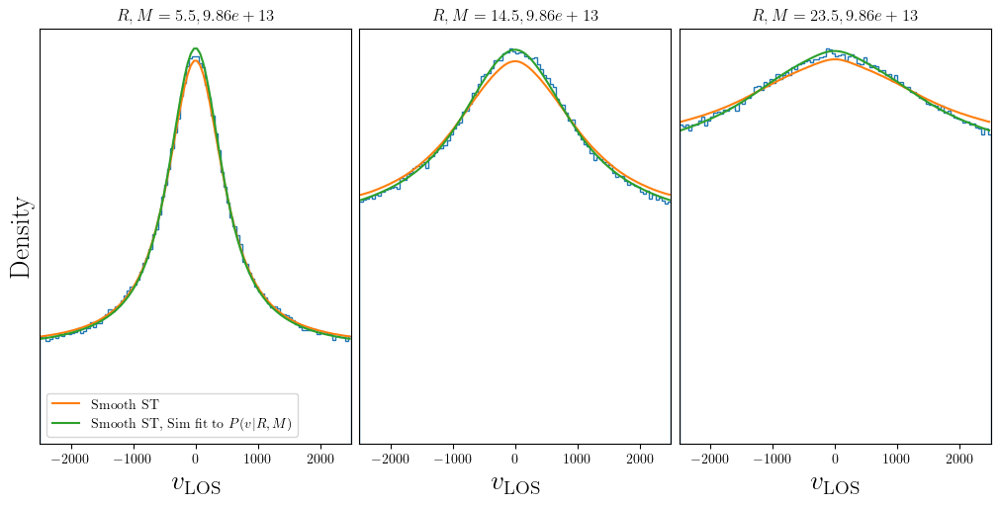

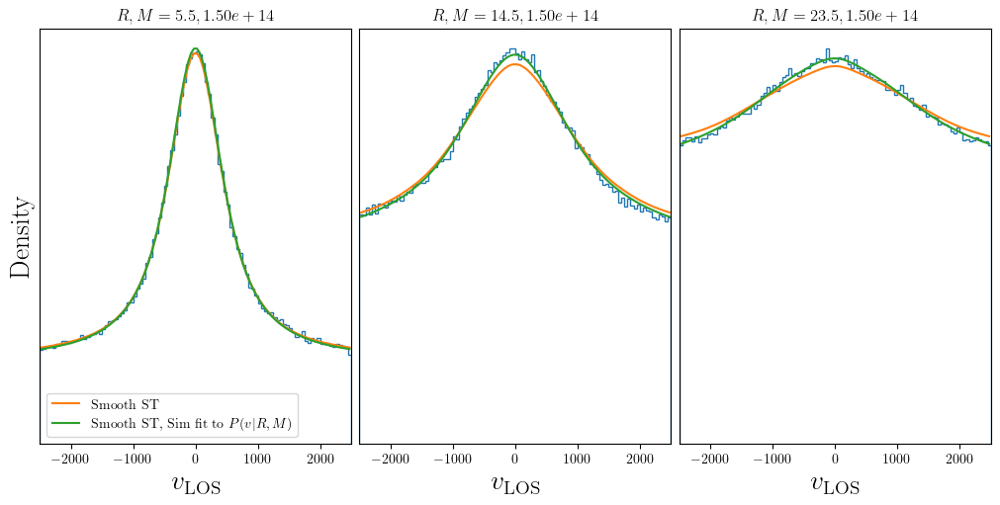

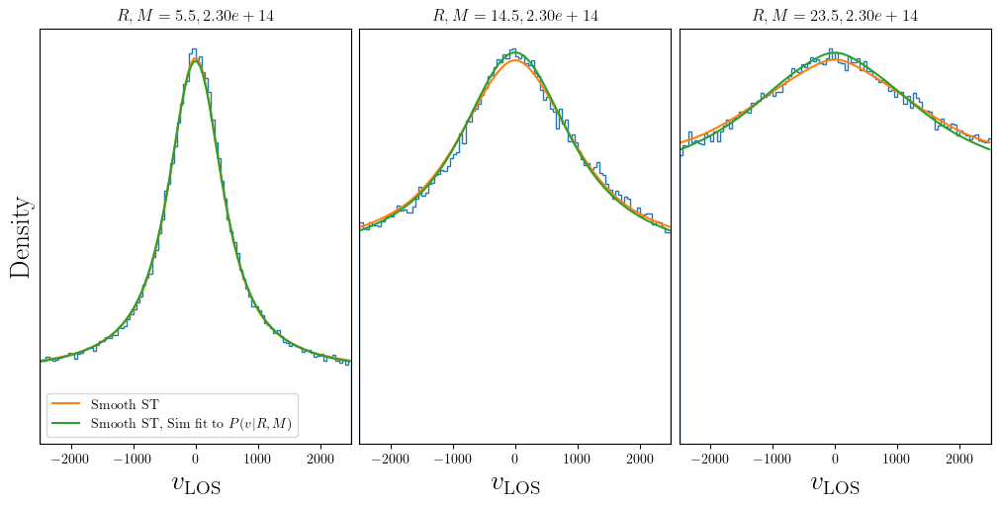

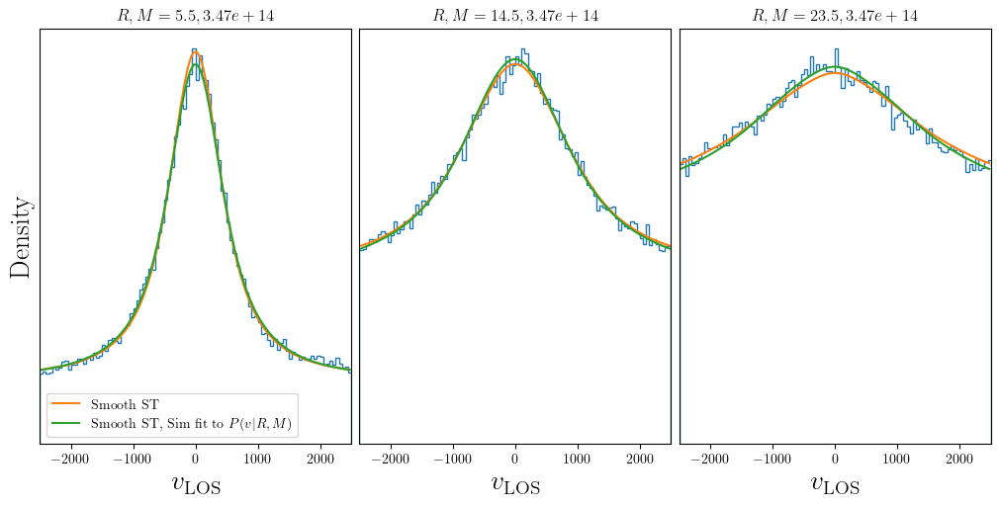

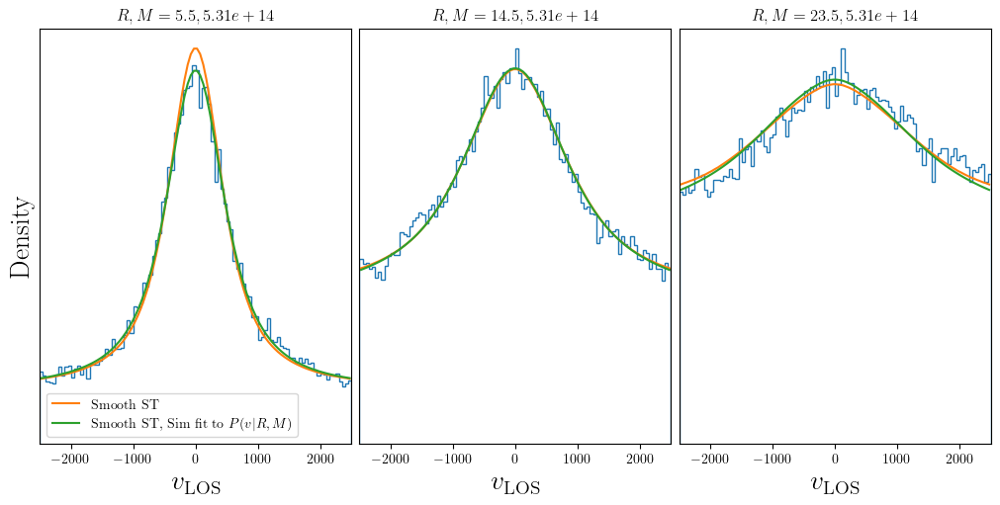

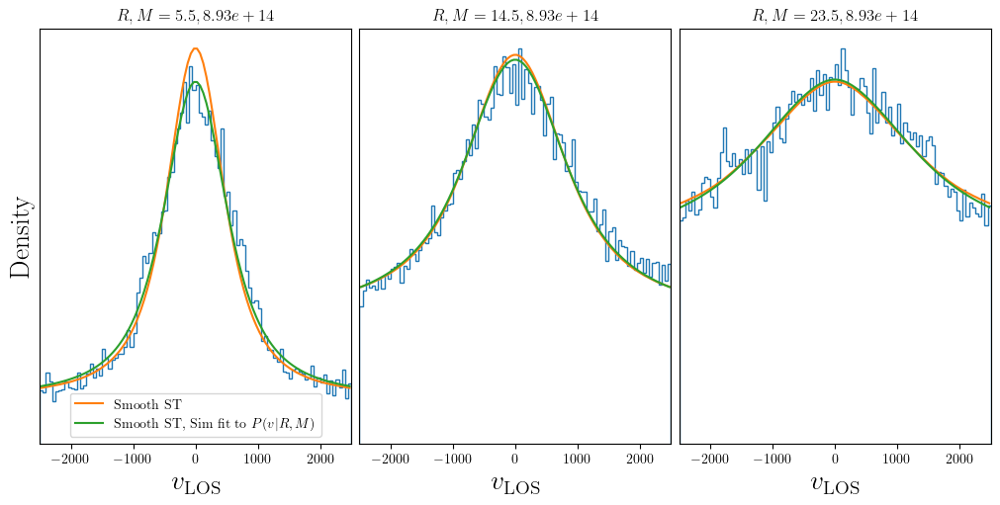

In [23]:
P = P_R_vec(vcens, r_cens, Mvirs, res)

for k in range(len(Mvirs)):
    fig, ax = plt.subplots(1, len(r_cens)//7, figsize=(10, 5), layout='constrained')
    for j in range(0, len(r_cens), 9):
        index = j + k*len(r_cens)

        hist, bins, _ = ax[j//7].hist(vphyslos[index], bins=vedges, density=True, histtype='step')
        #cent = 0.5*(bins[1:] + bins[:-1])

        ax[j//7].plot(vcens, P_R_smooth(vcens, r_cens[j], Mvirs[k], STsm_pars), label='Smooth ST', c='C1')
        ax[j//7].plot(vcens, P[:, j, k], label=r'Smooth ST, Sim fit to $P(v|R, M)$', c='C2')

        #ax[j//7].plot(vcens, P_vphys_R(cent, r_cens[j], Mvirs[k]), label='JoCond', c='C1', ls='--')

        ax[j//7].set_xlabel(r"$v_{\rm LOS}$", fontsize=20)
        ax[j//7].set_yticks([])
        ax[j//7].margins(x=0)
        ax[j//7].set_title(rf"$R, M = {r_cens[j]}, {Mvirs[k]:.2e}$")

    ax[0].legend()
    ax[0].set_ylabel(r"Density", fontsize=20)

In [340]:
# MLE
Bounds = [(np.min((0, np.sign(par)*np.inf)), np.max((0, np.sign(par)*np.inf))) for par in STsm_pars]

res = scipy.optimize.minimize(lambda p: -poisson_llh_vec(p), STsm_pars, bounds=Bounds, method='nelder-mead')
print("Initial: ", STsm_pars) 
print("MLE: ", res.x)

Initial:  [ 1.32035800e+02  2.67710000e+00  8.61500000e-01  1.89826428e+00
 -8.20558370e-01  2.73658808e+02  1.65323737e-01  1.02910000e-01
 -2.33000000e-02  1.16263577e+00  5.30301070e-01  1.35617629e+01
  5.27955626e+00]
MLE:  [ 4.75684399e+02  3.65571434e+00  2.75894305e+00  1.10989689e+01
 -2.49041680e-01  2.27772361e+02  2.37918113e-01  6.94509612e-01
 -1.16201510e-03  1.23288655e+00  7.69895211e-01  6.90621544e-03
  1.18739083e+00]


In [11]:
res = [ 4.75684399e+02,  3.65571434e+00,  2.75894305e+00,  1.10989689e+01,
        -2.49041680e-01,  2.27772361e+02,  2.37918113e-01,  6.94509612e-01,
        -1.16201510e-03,  1.23288655e+00,  7.69895211e-01,  6.90621544e-03,
        1.18739083e+00]

-1.0
ind: [15.19973714] 484.7395933364298 -0.5151010245338421
-1.0
ind: [69.57558548] 569.6696451639152 -0.49994718148056294
-1.0
ind: [108.37699754] 645.758289661983 -0.4583982067424266
-1.0
ind: [130.46459928] 710.1893642188268 -0.4206193808872567
-1.0
ind: [143.79293878] 761.7582634644391 -0.3883560223728775
-1.0
ind: [149.87400896] 800.770168864352 -0.36075576766234785


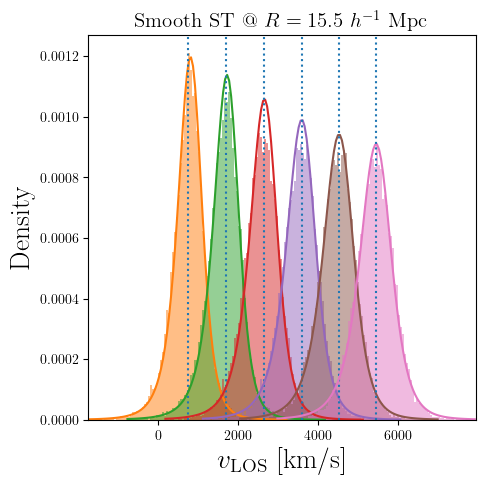

In [34]:
# test fit to P(vlos|R, rlos)
i, j, k = 10, 10, 0


# ve = np.linspace(-6000, 6000, 100+1)
# vc = 0.5*(ve[1:] + ve[:-1])

rlos_inds =[9, 19, 29, 39, 49, 59] #[9, 39] #

plt.figure(figsize=(5, 5))
rl_comb =rlos_inds[::-1]+rlos_inds

#P = P_R_rlos_vec(vc, r_cens, rlos_cens, Mvirs, STsm_pars)

for i, rl in enumerate(rlos_inds):
    #print(i-10 , i, i-10 < i)
    # if i == 0 or rl_comb[i-1] > rl_comb[i]:
    #     rlos = -rlos_cens[rl]
    #     sign = -1
    #     #print('neg')
    # else:
    #     rlos= rlos_cens[rl]
    #     sign = 1
    index = rl + j*len(rlos_cens) + (k//5)*len(r_cens)*len(rlos_cens)

    rlos= rlos_cens[rl]

    r = np.sqrt(r_cens[j]**2 + (rlos)**2)
    theta = np.arctan2((rlos), r_cens[j])
    sin = np.sin(theta)

    peak = RBinterp(np.log10(Mvirs[k]), r).squeeze() + a*H*(rlos)/h #interps[k](r)*sin 

    omA, om_sm, om_sb, om_bmp, om_bms, om_bbp, om_bbs, a_q, a_hm, a_hb, a_mm, a_mb, a_b = res #STsm_pars

    R = r_cens[j]
    M = Mvirs[k]
    M_p = 1e14

    om_s = line(R, om_sm, om_sb)
    om_bm = plaw(M/M_p, om_bmp, om_bms)
    om_bb = plaw(M/M_p, om_bbp, om_bbs)

    om_b = line(R, om_bm, om_bb)

    a_h = line(R, a_hm, a_hb)
    a_m = line(R, a_mm, a_mb)
    #print(R, a_mm, a_mb, a_m)

    omega = Erf(np.abs(rlos), omA, om_s, om_b)
    alpha = rhml_rad(np.abs(rlos), a_q, a_h, a_m, a_b)
    print(np.sign(alpha)*np.sign(rlos))

    xi = xi_from_peak(mode=RBinterp(np.log10(Mvirs[k]), r).squeeze(), omega=omega, alpha=np.sign(rlos)*alpha, nu=nus[0])
    print("ind:", xi, omega, alpha)

    M_ind = np.where(M == Mvirs)[0][0]

    ve = np.linspace(peak-2500, peak+2500, 100+1)
    vc = 0.5*(ve[1:] + ve[:-1])

    P = P_R_rlos_vec(vc, r_cens, rlos_cens, Mvirs, STsm_pars)

    hist, edges = np.histogram(vphyslos1[index], bins=ve, density=True)
    cent = 0.5*(edges[1:] + edges[:-1])

    test_hist, bins, _ = plt.hist(vphyslos1[rl + j*len(rlos_cens) + k*len(r_cens)*len(rlos_cens)], bins=ve, density=True, alpha=0.5, label='Data', color=f'C{rl//9}')
    cens = 0.5*(bins[1:] + bins[:-1])

    #plt.plot(cens, skewed_t_pdf(cens-a*H*(rlos)/h, xi, omega, np.sign(rlos)*alpha, nus[0]), c=f'C{rl//9}')
    plt.plot(vc, P[:, j, k, rl], c=f'C{rl//9}')

    plt.axvline(peak, label=r"$v_{\rm LOS} = v_{r, \rm peak}(r)\sin\theta + aHr_{\rm LOS}$", color=f'C{i//9}', ls=':')

    plt.title(rf"Smooth ST @ $R = {r_cens[j]}$ $h^{{-1}}$ Mpc", fontsize=15)
    plt.xlabel(r"$v_{\rm LOS}$ [km/s]", fontsize=20)
    plt.ylabel(r"Density", fontsize=20)
    plt.margins(x=0) 

    # if i == rlos_inds[0]:
    #     plt.legend()
    #     plt.ylim((0, 1.2*np.max(hist)))

In [ ]:
vlos = vcens
R = r_cens#[10]
rlos = np.linspace(-40, 40, 2*40+1)#[39]
M = Mvirs#[0]

omA, om_sm, om_sb, om_bmp, om_bms, om_bbp, om_bbs, a_q, a_hm, a_hb, a_mm, a_mb, a_b = STsm_pars

M_p = 1e14
r_p = 20
R_p = 10

# Reshape for broadcasting: (1, NR, 1, Nrlos)
R_    = R[None, :, None, None]
rlos_ = rlos[None, None, None, :]
M_    = M[None, None, :, None]
vlos_ = vlos[:, None, None, None]

r     = np.sqrt(R_**2 + rlos_**2)
theta = np.arctan2(rlos_, R_)
sin   = np.sin(theta)

om_s = line(R_, om_sm, om_sb)
om_bm = plaw(M_/M_p, om_bmp, om_bms)
om_bb = plaw(M_/M_p, om_bbp, om_bbs)

om_b = line(R_, om_bm, om_bb)

a_h = line(R_, a_hm, a_hb)
a_m = line(R_, a_mm, a_mb)

omega = Erf(np.abs(rlos_), omA, om_s, om_b)
alpha = np.sign(rlos_)*rhml_rad(np.abs(rlos_), a_q, a_h, a_m, a_b)

M_inds = [np.where(m == Mvirs)[0][0] for m in M]
#print(omega.shape)
vr = np.array([interps[M_ind](np.sqrt(R_i**2 + rlos_j**2)) for M_ind in M_inds for R_i in R for rlos_j in rlos]).reshape((len(Mvirs), len(R), len(rlos))).transpose(1, 0, 2)[np.newaxis] #np.array([interps[M_ind](r) for M_ind in M_inds]).reshape((1, len(R), len(Mvirs), len(rlos))) #*sin
vr_sin = vr * sin
#peak = vr_sin + a*H*rlos/h

_xi_vec = np.vectorize(xi_from_peak)

xi = _xi_vec(mode=vr_sin, omega=omega, alpha=alpha, nu=nus[0])

dist = skewed_t_pdf(vlos_, xi=xi, omega=omega,
                    alpha=alpha, nu=nus[0])

In [330]:
xi = xi_from_peak_vectorized(modes=vr_sin, omegas=omega, alphas=alpha, nu=nus[0])

In [306]:
vr_test = np.array([interps[M_ind](np.sqrt(R_i**2 + rlos_j**2)) for M_ind in M_inds for R_i in R for rlos_j in rlos]).reshape((len(Mvirs), len(R), len(rlos))).transpose(1, 0, 2)[np.newaxis]
vr_test.shape

(1, 25, 6, 81)

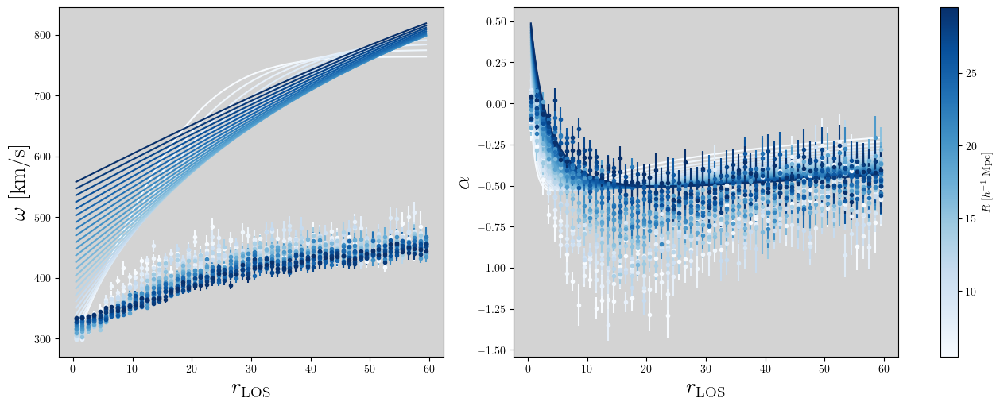

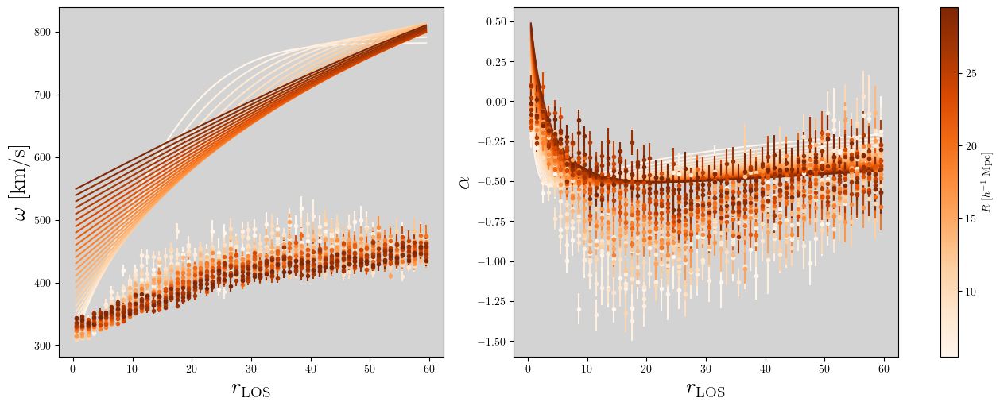

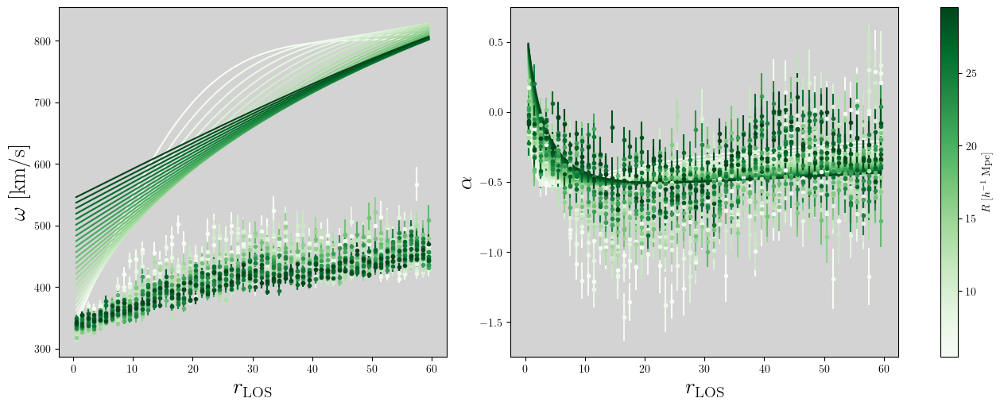

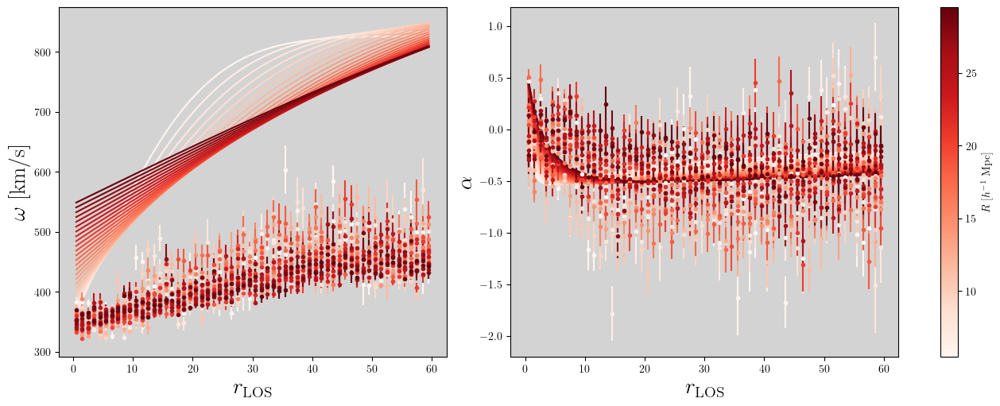

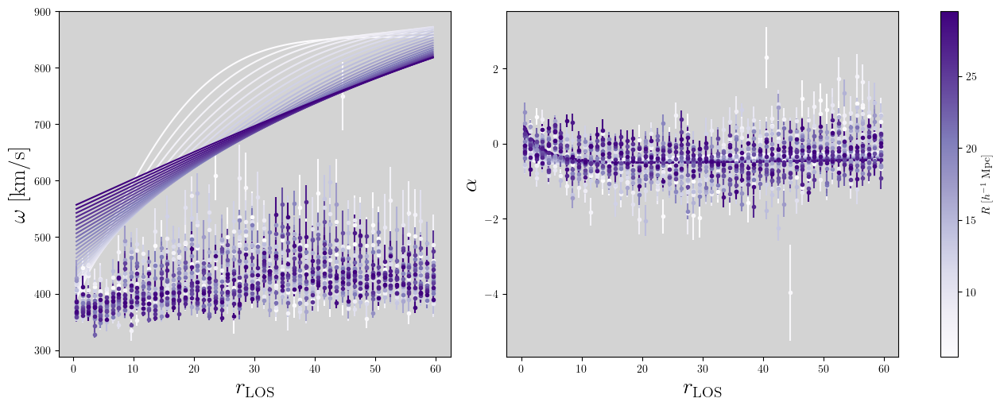

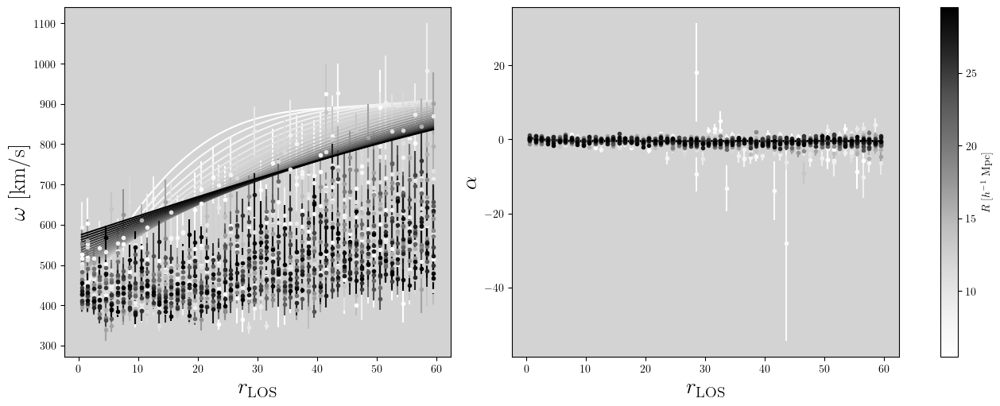

In [ ]:

from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

colormap_list = [plt.cm.Blues, plt.cm.Oranges, plt.cm.Greens, 
                 plt.cm.Reds, plt.cm.Purples, plt.cm.Greys]

cmaps = [cmap(np.linspace(0, 1, len(r_cens))) for cmap in colormap_list]

names = [r'$\xi$ [km/s]', r'$\omega$ [km/s]', r'$\alpha$', r'$\nu$']

lims = [(-500, 50), (300, 600), (-2, 1), (-0.05, 0.15)]

for k in range(0, len(Mvirs)):
    fig, ax = plt.subplots(1, 2, figsize=(25/2, 5), layout='constrained')
    for j in range(0, len(r_cens)): 
        #for i in range(1, len(names)-1):
        i = 1

        omA, om_sm, om_sb, om_bmp, om_bms, om_bbp, om_bbs, a_q, a_hm, a_hb, a_mm, a_mb, a_b = res.x #STsm_pars

        R = r_cens[j]
        M = Mvirs[k]
        M_p = 1e14

        om_s = line(R, om_sm, om_sb)
        om_bm = plaw(M/M_p, om_bmp, om_bms)
        om_bb = plaw(M/M_p, om_bbp, om_bbs)

        om_b = line(R, om_bm, om_bb)

        a_h = line(R, a_hm, a_hb)
        a_m = line(R, a_mm, a_mb)

        #omega = Erf(np.abs(rlos), omA, om_s, om_b)
        #alpha = rhml_rad(np.abs(rlos_vals[i]), a_q, a_h, a_m, a_b)

        rs = np.linspace(rlos_cens[0], rlos_cens[-1], 1000)

        #ax[i-1].plot(rlos_cens, STpars[0, k, j, :, i], c=cmaps[k][j], marker='o', markersize=3)
        ax[i-1].errorbar(rlos_cens, STpars[0, k, j, :, i], STerrs[0, k, j, :, i], color=cmaps[k][j], fmt='o', markersize=3)
        
        #w_fit, w_c = curve_fit(Erf, rlos_cens, STpars[0, k, j, :, i], sigma=STerrs[0, k, j, :, i], p0=[140, 20, 300], bounds=([0, 0, 250], [1e3, 1e3, 500]))
        ax[i-1].plot(rs, Erf(rs, omA, om_s, om_b), color=cmaps[k][j])


        ax[i-1].set_facecolor('lightgray')
        ax[i-1].set_xlabel(r"$r_{\rm LOS}$", fontsize=20)
        ax[i-1].set_ylabel(names[i], fontsize=20)
        #ax[i-1].set_ylim(lims[i])

        i = 2
        ax[i-1].errorbar(rlos_cens, STpars[0, k, j, :, i], STerrs[0, k, j, :, i], color=cmaps[k][j], fmt='o', markersize=3)

        #try:

        a_p, c = curve_fit(rhml_rad, rlos_cens, STpars[0, k, j, :, i], sigma=STerrs[0, k, j, :, i], p0=[0.04906177 , 1.14641561, 12.51124666,  3.11980491], maxfev=50_000, bounds=((0, 1e-2, 1e-5, 1e-2), (10, 1e3, 1e3, 1e4)) ) # 
        #print(i, j, k, a_p)
        ax[i-1].plot(rs, rhml_rad(rs, a_q, a_h, a_m, a_b), color=cmaps[k][j])

        ax[i-1].set_xlabel(r"$r_{\rm LOS}$", fontsize=20)
        ax[i-1].set_ylabel(names[i], fontsize=20)
        #ax[i-1].set_ylim(lims[i])

        ax[i-1].set_facecolor('lightgray')

    Norm = Normalize(vmin=min(r_cens), vmax=max(r_cens))
    sm = ScalarMappable(norm=Norm, cmap=colormap_list[k])
    sm.set_array([])  # dummy array
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label(r"$R \ [h^{-1}$ Mpc]")

In [84]:
P = P_R_smooth(vcens, r_cens[0], Mvirs[0], res)

In [85]:
P2 = P_R_vec(vcens, r_cens, Mvirs, res)

In [82]:
def RG_llh_ind(pars, data, r_ind):
    M, s = pars 

    M_p = 1e14

    dv = (vedges[-1]-vedges[0])/(len(vedges)-1)

    N_avg = np.sum(data) * P_R_smooth(vcens, r_cens[r_ind], M*M_p, res) * dv

    sigmasq = N_avg + s**2 * N_avg**2

    chisq = ((data) - N_avg)**2 / sigmasq  

    return - 0.5 * np.sum(chisq + np.log(sigmasq))

def G_llh_ind(pars, data, r_ind):
    M = pars 

    M_p = 1e14

    dv = (vedges[-1]-vedges[0])/(len(vedges)-1)

    N_avg = np.sum(data) * P_R(vcens, r_cens[r_ind], M*M_p, res.x) * dv

    sigmasq = N_avg 

    chisq = ((data) - N_avg)**2 / sigmasq  

    return - 0.5 * np.sum(chisq + np.log(sigmasq))

In [ ]:
# MLE 
soln = scipy.optimize.minimize(lambda p: -RG_llh_ind(p, Nv_R[0, 0], 0), [Mvirs[0]/1e14, 0.01], method='nelder-mead', )
print("Initial: ", [Mvirs[0]/1e14, 0.01]) 
print("MLE: ", soln.x) 

Initial:  [np.float32(0.98642004), 0.01]
MLE:  [0.88997062 0.01617559]


In [73]:
pars = np.zeros((len(Mvirs), len(r_cens), 2))
#errs = np.zeros((len(Mvirs), len(r_cens), 2))


for k in range(len(Mvirs)):
    for i in range(len(r_cens)):
        p_init = [Mvirs[k]/1e14, 0.01]

        soln = scipy.optimize.minimize(lambda p: -RG_llh_ind(p, Nv_R[k, i], i), p_init, 
                                    #bounds = [(0.5, 12), (-0.1, 0.1)],#, (0, np.inf), (0, np.inf)], 
                                    method='nelder-mead', 
                                    )
        print("Initial: ",p_init) 
        print("MLE: ", soln.x) 
        print(soln.message)

        pars[k, i] = soln.x

Initial:  [np.float32(0.98642004), 0.01]
MLE:  [0.88997062 0.01617559]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [0.86444495 0.0101155 ]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [0.94137564 0.00378289]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [0.98641586 0.00428763]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.00765541 0.00464221]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [0.97765608 0.00602224]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [0.98644869 0.00839541]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [ 9.48543163e-01 -4.77159628e-06]
Optimization terminated successfully.
Initial:  [np.float32(0.98642004), 0.01]
MLE:  [1.031925   0.00308143]
Optimization terminated successfully.
Initial: 

KeyboardInterrupt: 

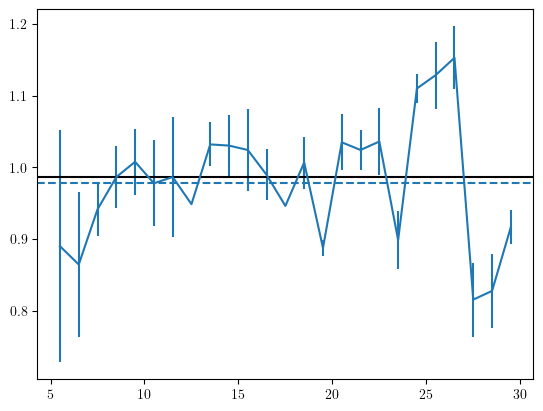

In [78]:
plt.errorbar(r_cens, pars[0, :, 0], 10*np.abs(pars[0, :, 1]))
plt.axhline(Mvirs[0]/1e14, color='k', ls='-')
plt.axhline(np.mean(pars[0, :, 0]), color='C0', ls='--')


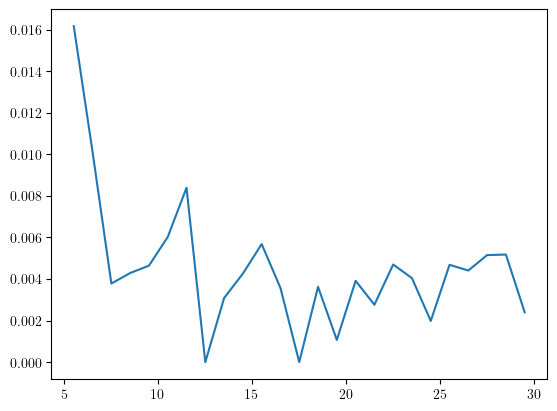

In [75]:
plt.plot(r_cens, pars[0, :, 1])
